# TP Coding an autoencoder in Pytorch

Author : Alasdair Newson

alasdair.newson@telecom-paris.fr

## Objective:

The goal of this TP is to explore autoencoders and variational autoencoders applied to a simple dataset. In this first part, we will look at an autoencoder applied to MNIST. We recall that an autoencoder is a neural network with the following general architecture:

![AUTOENCODER](https://perso.telecom-paristech.fr/anewson/doc/images/autoencoder_illustration_2.png)

The tensor $z$ in the middle of the network is called a __latent code__, and it belongs to the latent space. It is this latent space which is interesting in autoencoders (for image synthesis, editing, etc).

### Your task:
You need to add the missing parts in the code (parts between # --- START CODE HERE and # --- END CODE HERE or # FILL IN CODE)


First of all, let's load some packages

In [528]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image

import pdb
import numpy as np
import matplotlib.pyplot as plt

def pytorch_to_numpy(x):
  return x.detach().numpy()

Now, we load the MNIST dataset, which we will use for training a simple autoencoder.

In [2]:
# MNIST Dataset
mnist_trainset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
mnist_testset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

#create data loader with smaller dataset size
max_mnist_size = 1000
mnist_trainset_reduced = torch.utils.data.random_split(mnist_trainset, [max_mnist_size, len(mnist_trainset)-max_mnist_size])[0] 
mnist_train_loader = torch.utils.data.DataLoader(mnist_trainset_reduced, batch_size=256, shuffle=True,drop_last=True)

# download test dataset
max_mnist_size = 512
mnist_testset_reduced = torch.utils.data.random_split(mnist_testset, [max_mnist_size, len(mnist_testset)-max_mnist_size])[0] 
mnist_test_loader = torch.utils.data.DataLoader(mnist_testset_reduced, batch_size=256, shuffle=True,drop_last=True)


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw



In [3]:
mnist_trainset_reduced.dataset.train_data.shape

/Users/pierreloviton/opt/anaconda3/lib/python3.9/site-packages/torchvision/datasets/mnist.py:75: UserWarning: train_data has been renamed data
  warnings.warn("train_data has been renamed data")


torch.Size([60000, 28, 28])

# 1 Vanilla Autoencoder

Now, we define the general parameters of our autoencoder. In particular, we note that the latent space is of size 10. We have chosen this since there are 10 digits, but you can change this as you wish.

In [263]:
# autoencoder parameters
n_rows = mnist_trainset_reduced.dataset.train_data.shape[1]
n_cols = mnist_trainset_reduced.dataset.train_data.shape[2]
n_channels = 1
n_pixels = n_rows*n_cols

img_shape = (n_rows, n_cols, n_channels)
z_dim = 10 # number of labels here but you can change this as you wish
n_epochs = 100

Now, define the autoencoder architecture by creating a Pytorch class. We will use the following MLP architecture :

Encoder :
- Flatten input
- Dense layer $+$ ReLU
- Dense layer $+$ ReLU
- Dense layer (no non-linearity), output size ```z_dim```

Decoder :
- Dense layer $+$ ReLU
- Dense layer $+$ ReLU
- Dense layer $+$ Sigmoid Activation
- Reshape, to size $28\times 28\times 1$

The intermediate dimensions are referred to as ```h_dim_1``` and ```h_dim2```. For the reshape operation (and even the flatten), you can use the __view__ operation of Pytorch, for example:
- ```x.view(-1,n_channels, n_rows,n_cols)```

You can use the ```F.relu()``` function for the ReLU non-linearity (or any other choice you like).

In [203]:
class AE(torch.nn.Module ):
  def __init__(self, x_dim, h_dim1, h_dim2, z_dim,n_rows,n_cols,n_channels):
    super(AE, self).__init__()

    self.n_rows = n_rows
    self.n_cols = n_cols
    self.n_channels = n_channels
    self.n_pixels = (self.n_rows)*(self.n_cols)
    self.z_dim = z_dim

    # encoder part
    self.fc1 = nn.Linear(x_dim, h_dim1) # FILL IN STUDENT 
    self.fc2 = nn.Linear(h_dim1, h_dim2) # FILL IN STUDENT 
    self.fc3 = nn.Linear(h_dim2, z_dim) # FILL IN STUDENT 
    # decoder part
    self.fc4 = nn.Linear(z_dim, h_dim2) # FILL IN STUDENT 
    self.fc5 = nn.Linear(h_dim2, h_dim1) # FILL IN STUDENT 
    self.fc6 = nn.Linear(h_dim1, x_dim) # FILL IN STUDENT 

  def encoder(self, x):
    h = F.relu(self.fc1(x.view(-1, self.n_pixels)))# FILL IN STUDENT 
    h = F.relu(self.fc2(h)) # FILL IN STUDENT 
    return self.fc3(h) # FILL IN STUDENT 
  def decoder(self, z):
    h = F.relu(self.fc4(z))# FILL IN STUDENT 
    h = F.relu(self.fc5(h)) # FILL IN STUDENT 
    return F.sigmoid(self.fc6(h)).view(-1,n_channels, n_rows,n_cols) # FILL IN STUDENT 
  def forward(self, x):
    z = self.encoder(x) # FILL IN STUDENT 
    return self.decoder(z)
  def loss_function(self,x, y):
    bce_loss = F.binary_cross_entropy(y, x, reduction='mean')#.view(-1, self.n_pixels))   # FILL IN STUDENT 
    return bce_loss#torch.mean(bce_loss)

In [204]:
# create an instance of the model
ae_dim_1 = 512
ae_dim_2 = 256
ae_model = AE(x_dim=n_pixels, h_dim1= ae_dim_1, h_dim2=ae_dim_2, z_dim=z_dim,n_rows=n_rows,n_cols=n_cols,n_channels=n_channels)
ae_optimizer = optim.Adam(ae_model.parameters())

In [205]:
print(ae_model)

AE(
  (fc1): Linear(in_features=784, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=1, bias=True)
  (fc4): Linear(in_features=1, out_features=256, bias=True)
  (fc5): Linear(in_features=256, out_features=512, bias=True)
  (fc6): Linear(in_features=512, out_features=784, bias=True)
)


Now, define a generic function to train the model for one epoch

In [206]:
def train_ae(ae_model,data_train_loader,epoch):
	train_loss = 0
	for batch_idx, (data, _) in enumerate(data_train_loader):
		ae_optimizer.zero_grad()
		y = ae_model(data) # FILL IN STUDENT
		#print(y)
		loss_ae = ae_model.loss_function(data, y) # FILL IN STUDENT 
		loss_ae.backward()
		train_loss += loss_ae.item()
		ae_optimizer.step()
		
		if batch_idx % 100 == 0:
			print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
				epoch, batch_idx * len(data), len(data_train_loader.dataset),
				100. * batch_idx / len(data_train_loader), loss_ae.item() / len(data)))
	print('====> Epoch: {} Average loss: {:.4f}'.format(epoch, train_loss / len(data_train_loader.dataset)))


Finally, train the model for ```n_epochs``` epochs

In [207]:
for batch_idx, (data, _) in enumerate(mnist_train_loader):
    print(ae_model(data[batch_idx]).view(-1,28*28).shape)
    print(ae_model(data[batch_idx]).shape)

    print(ae_model.forward(data[batch_idx]).shape)
    break

torch.Size([1, 784])
torch.Size([1, 1, 28, 28])
torch.Size([1, 1, 28, 28])


In [208]:
for epoch in range(0, n_epochs):
  train_ae(ae_model,mnist_train_loader,epoch)

Train Epoch: 0 [0/1000 (0%)]	Loss: 0.002716
====> Epoch: 0 Average loss: 0.0020
Train Epoch: 1 [0/1000 (0%)]	Loss: 0.002301
====> Epoch: 1 Average loss: 0.0015
Train Epoch: 2 [0/1000 (0%)]	Loss: 0.001412
====> Epoch: 2 Average loss: 0.0011
Train Epoch: 3 [0/1000 (0%)]	Loss: 0.001200
====> Epoch: 3 Average loss: 0.0009
Train Epoch: 4 [0/1000 (0%)]	Loss: 0.001124
====> Epoch: 4 Average loss: 0.0009
Train Epoch: 5 [0/1000 (0%)]	Loss: 0.001119
====> Epoch: 5 Average loss: 0.0008
Train Epoch: 6 [0/1000 (0%)]	Loss: 0.001063
====> Epoch: 6 Average loss: 0.0008
Train Epoch: 7 [0/1000 (0%)]	Loss: 0.001012
====> Epoch: 7 Average loss: 0.0008
Train Epoch: 8 [0/1000 (0%)]	Loss: 0.001024
====> Epoch: 8 Average loss: 0.0008
Train Epoch: 9 [0/1000 (0%)]	Loss: 0.001000
====> Epoch: 9 Average loss: 0.0008
Train Epoch: 10 [0/1000 (0%)]	Loss: 0.000980
====> Epoch: 10 Average loss: 0.0008
Train Epoch: 11 [0/1000 (0%)]	Loss: 0.000969
====> Epoch: 11 Average loss: 0.0008
Train Epoch: 12 [0/1000 (0%)]	Loss: 

In [200]:
# some functions to display images and autoencoded images

def display_images(imgs):
  
  r = 1
  c = imgs.shape[0]
  fig, axs = plt.subplots(r, c)
  for j in range(c):
    #black and white images
    axs[j].imshow(pytorch_to_numpy(imgs[j, 0,:,:]), cmap='gray')
    axs[j].axis('off')
  plt.show()

def display_ae_images(ae_model, test_imgs):
  n_images = 5
  idx = np.random.randint(0, test_imgs.shape[0], n_images)
  test_imgs = test_imgs[idx,:,:,:]
  print(test_imgs.shape)

  #get output images
  output_imgs = pytorch_to_numpy(ae_model.forward( test_imgs ))
  print(output_imgs.shape)
  
  r = 2
  c = n_images
  fig, axs = plt.subplots(r, c)
  for j in range(c):
    #black and white images
    axs[0,j].imshow(test_imgs[j, 0,:,:], cmap='gray')
    axs[0,j].axis('off')
    axs[1,j].imshow(output_imgs[j, 0,:,:], cmap='gray')
    axs[1,j].axis('off')
  plt.show()

torch.Size([5, 1, 28, 28])
(5, 1, 28, 28)


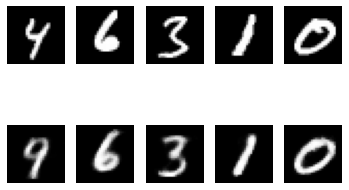

In [192]:
### z_dim = 10
test_imgs = next(iter(mnist_train_loader))[0]
display_ae_images(ae_model, test_imgs)

Do these autoencoded images look good to you ? You can try to change the latent space size to see if the results improve. 

torch.Size([5, 1, 28, 28])
(5, 1, 28, 28)


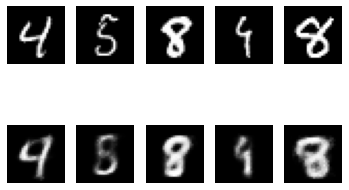

In [201]:
### z_dim = 32
test_imgs = next(iter(mnist_train_loader))[0]
display_ae_images(ae_model, test_imgs)

torch.Size([5, 1, 28, 28])
(5, 1, 28, 28)


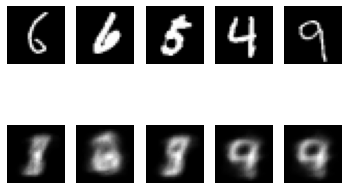

In [209]:
### z_dim = 1
test_imgs = next(iter(mnist_train_loader))[0]
display_ae_images(ae_model, test_imgs)

# 2/ Variational autoencoder

Now, we are going to create an variational autoencoder to carry out __image generation__. Let's first recall the idea of a variational autoencoder

## Main idea

The main idea is to create an autoencoder whose latent codes follow a certain distribution (a Gaussian distribution in practice). This is done with two tools : 

- A specific architecture, where the encoder produces the average and variance of the latent codes
- A specially designed loss function

Once the VAE is trained, it is possible to sample in the latent space by producing random normal variables and simply decoding.

## Architecture

The architecture of the VAE model is as follows:

The encoder consists of:

Encoder :
- Flatten input
- Dense layer $+$ ReLU
- Dense layer $+$ ReLU
- Dense layer (no non-linarity) to produce the average, Dense layer (no non-linarity) to produce the variance (these last two layers are in parallel)

Decoder :
- Dense layer $+$ ReLU
- Dense layer $+$ ReLU
- Dense layer $+$ Sigmoid Activation
- Reshape, to size $28\times 28\times 1$


## Variational Autoencoder loss

Recall that for the VAE, the loss function is in fact a function to __maximise__. In fact, for implementation, you will see that it is easier to __minimise__ $-\mathcal{L}$.

In the case of an image which is represented by a set of __Bernoulli__ variables (which is relevant for mnist), the original loss function (to maximise) is written :


\begin{align}
\mathcal{L} &= \log\left(p_\theta(x|z)\right) - KL\left( q_\phi(z|x) \; || \; p_\theta(z)\right) \\
    &= \left(\sum_{i} x_i \log y_i + (1-x_i) \log (1-y_i)\right) - \left(\frac{1}{2} \sum_j \left( \sigma_j^2 + \mu_j^2 - \log \sigma_j^2 -1 \right)\right)
\end{align}


where $i$ is summed over the image pixels, and $j$ is summed over the elements of the latent space. $\sigma_j^2$ is the $j$th element of the latent space variance, and $\mu_j$ is the $j$th element of the latent space mean.

The left part of the loss (reconstruction error) can be implemented simply as the binary cross-entropy between the input x and the output y. Since we are __maximising__ $-$[binary cross-entropy] (look at the formula), this is equivalent to minimising the binary cross-entropy.

For the right part of the equation (KL divergence), you need to implement it manually. 

The final loss is the average, over the batch size, of the sum of the reconstruction error (left part) and the KL divergence (right part). Be careful, in the formula, the sums over $i$ and $j$ are over the number of pixels and the number of latent elements, respectively. To achieve a sum rather than an average, you can use ```torch.nn.BCELoss(reduction='sum')()```, and the ```torch.sum()``` functions.

As in the case of the normal autoencoder, you will need to flatten and then reshape the tensors at the beginning/end of the network.

In [442]:
class VAE(torch.nn.Module ):
    def __init__(self, x_dim, h_dim1, h_dim2, z_dim,n_rows,n_cols,n_channels):
        super(VAE, self).__init__()

        self.n_rows = n_rows
        self.n_cols = n_cols
        self.n_channels = n_channels
        self.n_pixels = (self.n_rows)*(self.n_cols)
        self.z_dim = z_dim

        # encoder part
        self.fc1 = nn.Linear(x_dim, h_dim1) #FILL IN STUDENT
        self.fc2 = nn.Linear(h_dim1, h_dim2) #FILL IN STUDENT
        self.fc31 = nn.Linear(h_dim2, z_dim) #FILL IN STUDENT
        self.fc32 = nn.Linear(h_dim2, z_dim) #FILL IN STUDENT
        # decoder part
        self.fc4 = nn.Linear(z_dim, h_dim2) #FILL IN STUDENT
        self.fc5 = nn.Linear(h_dim2, h_dim1) #FILL IN STUDENT
        self.fc6 = nn.Linear(h_dim1, x_dim) #FILL IN STUDENT
    

    def encoder(self, x):
        h = F.relu(self.fc1(x.view(-1, self.n_pixels))) #FILL IN STUDENT
        h = F.relu(self.fc2((h))) #FILL IN STUDENT
        return F.relu(self.fc31(h)), F.relu(self.fc32(h)) #FILL IN STUDENT (remember, there are two outputs)
                   
    def decoder(self, z):
        h = F.relu(self.fc4(z)) #FILL IN STUDENT
        h = F.relu(self.fc5(h)) #FILL IN STUDENT
        return F.sigmoid(self.fc6(h)).view(-1,n_channels, n_rows,n_cols) #FILL IN STUDENT

    def sampling(self, mu, log_var):
        # this function samples a Gaussian distribution, with average (mu) and standard deviation specified (using log_var)
        std = torch.exp(0.5*log_var)
        eps = torch.randn_like(std)
        return eps.mul(std).add_(mu) # return z sample

    def forward(self, x):
        z_mu, z_log_var = self.encoder(x) #FILL IN STUDENT
        z = self.sampling(z_mu, z_log_var) #FILL IN STUDENT
        return self.decoder(z), z_mu, z_log_var

    def loss_function(self,x, y, mu, log_var):
        reconstruction_error = F.binary_cross_entropy(y.view(-1, self.n_pixels), x.view(-1, self.n_pixels), reduction='sum')

        KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        return reconstruction_error + KLD

Now, create the model (similarly as above)

In [443]:
# create model
vae_dim_1 = ae_dim_1
vae_dim_2 = ae_dim_2
vae_model = VAE(x_dim=n_pixels, h_dim1= vae_dim_1, h_dim2=vae_dim_2, z_dim=z_dim,n_rows=n_rows,n_cols=n_cols,n_channels=n_channels)
vae_optimizer = optim.Adam(vae_model.parameters())

Finally, train the model. First modify the training function to the case of the vae.

In [461]:
def train_vae(vae_model,data_train_loader,epoch):
  train_loss = 0
  for batch_idx, (data, _) in enumerate(data_train_loader):
    vae_optimizer.zero_grad()
    y, z_mu, z_log_var = vae_model(data) #FILL IN STUDENT
    loss_vae = vae_model.loss_function(data, y, z_mu, z_log_var) #FILL IN STUDENT
    loss_vae.backward()
    train_loss += loss_vae.item()
    vae_optimizer.step() 
		
    if batch_idx % 100 == 0:
      print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
      epoch, batch_idx * len(data), len(data_train_loader.dataset),
      100. * batch_idx / len(data_train_loader), loss_vae.item() / len(data)))
  print('====> Epoch: {} Average loss: {:.4f}'.format(epoch, train_loss / len(data_train_loader.dataset)))


In [445]:
# now train the model
n_epochs
for epoch in range(0, n_epochs):
  train_vae(vae_model,mnist_train_loader,epoch)

Train Epoch: 0 [0/1000 (0%)]	Loss: 544.223633
====> Epoch: 0 Average loss: 403.0358
Train Epoch: 1 [0/1000 (0%)]	Loss: 476.668976
====> Epoch: 1 Average loss: 337.4124
Train Epoch: 2 [0/1000 (0%)]	Loss: 351.531708
====> Epoch: 2 Average loss: 244.4673
Train Epoch: 3 [0/1000 (0%)]	Loss: 280.602783
====> Epoch: 3 Average loss: 195.6958
Train Epoch: 4 [0/1000 (0%)]	Loss: 229.732300
====> Epoch: 4 Average loss: 171.6168
Train Epoch: 5 [0/1000 (0%)]	Loss: 213.252243
====> Epoch: 5 Average loss: 166.6003
Train Epoch: 6 [0/1000 (0%)]	Loss: 212.490997
====> Epoch: 6 Average loss: 164.2983
Train Epoch: 7 [0/1000 (0%)]	Loss: 213.593231
====> Epoch: 7 Average loss: 161.2441
Train Epoch: 8 [0/1000 (0%)]	Loss: 206.794510
====> Epoch: 8 Average loss: 159.4796
Train Epoch: 9 [0/1000 (0%)]	Loss: 208.200272
====> Epoch: 9 Average loss: 160.6276
Train Epoch: 10 [0/1000 (0%)]	Loss: 205.639603
====> Epoch: 10 Average loss: 157.1971
Train Epoch: 11 [0/1000 (0%)]	Loss: 209.973587
====> Epoch: 11 Average los

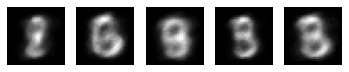

In [453]:
def generate_images_vae(vae_model,n_images = 5):

  epsilon = torch.randn(n_images,1,vae_model.z_dim)
  imgs_generated = vae_model.decoder(epsilon)
  return(imgs_generated)

imgs_generated = generate_images_vae(vae_model,n_images=5)
display_images(imgs_generated)

In [345]:
# now train the model

for epoch in range(0, 1000):
  train_vae(vae_model,mnist_train_loader,epoch)

Train Epoch: 0 [0/1000 (0%)]	Loss: 178.796112
====> Epoch: 0 Average loss: 136.8931
Train Epoch: 1 [0/1000 (0%)]	Loss: 173.443329
====> Epoch: 1 Average loss: 135.6453
Train Epoch: 2 [0/1000 (0%)]	Loss: 175.568741
====> Epoch: 2 Average loss: 135.3439
Train Epoch: 3 [0/1000 (0%)]	Loss: 171.877045
====> Epoch: 3 Average loss: 135.8751
Train Epoch: 4 [0/1000 (0%)]	Loss: 176.781830
====> Epoch: 4 Average loss: 135.4104
Train Epoch: 5 [0/1000 (0%)]	Loss: 180.439789
====> Epoch: 5 Average loss: 136.2165
Train Epoch: 6 [0/1000 (0%)]	Loss: 176.497269
====> Epoch: 6 Average loss: 135.4214
Train Epoch: 7 [0/1000 (0%)]	Loss: 174.955933
====> Epoch: 7 Average loss: 134.5623
Train Epoch: 8 [0/1000 (0%)]	Loss: 177.923935
====> Epoch: 8 Average loss: 134.8942
Train Epoch: 9 [0/1000 (0%)]	Loss: 173.213394
====> Epoch: 9 Average loss: 136.1046
Train Epoch: 10 [0/1000 (0%)]	Loss: 178.373077
====> Epoch: 10 Average loss: 134.9424
Train Epoch: 11 [0/1000 (0%)]	Loss: 177.686295
====> Epoch: 11 Average los

Now, generate some images with the VAE model

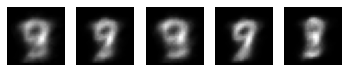

In [341]:
def generate_images_vae(vae_model,n_images = 5):

  epsilon = torch.randn(n_images,1,vae_model.z_dim)
  imgs_generated = vae_model.decoder(epsilon)
  return(imgs_generated)

imgs_generated = generate_images_vae(vae_model,n_images=5)
display_images(imgs_generated)

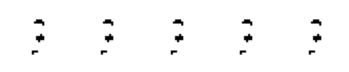

In [335]:
def generate_images_vae(vae_model,n_images = 5):

  epsilon = torch.randn(n_images,1,vae_model.z_dim)
  imgs_generated = vae_model.decoder(epsilon)
  return(imgs_generated)

imgs_generated = generate_images_vae(vae_model,n_images=5)
display_images(imgs_generated)

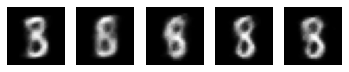

In [352]:
def generate_images_vae(vae_model,n_images = 5):

  epsilon = torch.randn(n_images,1,vae_model.z_dim)
  imgs_generated = vae_model.decoder(epsilon)
  return(imgs_generated)

imgs_generated = generate_images_vae(vae_model,n_images=5)
display_images(imgs_generated)

In [405]:
# function to plot the latent space
def plot_latent_space(vae_model, data_loader):
    # set model to evaluation mode
    vae_model.eval()
    with torch.no_grad():
        # get data from data_loader
        for batch_idx, (data, labels) in enumerate(data_loader):
            # encode data into the latent space
            z_mu, z_log_var = vae_model.encoder(data)
            z = vae_model.sampling(z_mu, z_log_var)
            # flatten z into a 2D matrix
            #z = z.view(z.size(0), -1)
            #if batch_idx == 0:
            #    latent = z
            #else:
            #    latent = torch.cat((latent, z), dim=0)
        # perform PCA on the latent matrix to reduce the dimensions
        z = z.detach().numpy()
        pca = PCA(n_components=2)
        latent = pca.fit_transform(z)
        # plot the encoded representations in 2D
        plt.scatter(latent[:, 0], latent[:, 1], c=labels, cmap='tab10')
        plt.colorbar()
        plt.show()
        print(latent.shape)


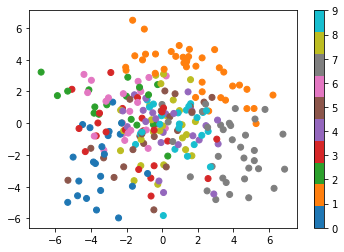

(256, 2)


In [406]:
from sklearn.decomposition import PCA
plot_latent_space(vae_model, mnist_train_loader)

What do you think of the results ? You can try and change the latent space size, or use convolutional layers instead to improve the results.

## - Convolutional VAE

In [501]:
# MNIST Dataset
mnist_trainset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
mnist_testset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

#create data loader with smaller dataset size
max_mnist_size = 1000
mnist_trainset_reduced = torch.utils.data.random_split(mnist_trainset, [max_mnist_size, len(mnist_trainset)-max_mnist_size])[0] 
mnist_train_loader = torch.utils.data.DataLoader(mnist_trainset_reduced, batch_size=256, shuffle=True,drop_last=True)

# download test dataset
max_mnist_size = 512
mnist_testset_reduced = torch.utils.data.random_split(mnist_testset, [max_mnist_size, len(mnist_testset)-max_mnist_size])[0] 
mnist_test_loader = torch.utils.data.DataLoader(mnist_testset_reduced, batch_size=256, shuffle=True,drop_last=True)

In [516]:
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

#train_transform = transforms.Compose([
#transforms.ToTensor(),])

test_transform = transforms.Compose([
transforms.ToTensor(),
])

#train_dataset.transform = train_transform
test_dataset.transform = test_transform

In [502]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 8, 3, stride=2, padding=1),
            nn.ReLU(True),
            nn.Conv2d(8, 16, 3, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.Conv2d(16, 32, 3, stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 32, 128),
            nn.ReLU(True),
            nn.Linear(128, encoded_space_dim)
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim,fc2_input_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 32),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, 
            padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [503]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 4

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d,fc2_input_dim=128)
decoder = Decoder(encoded_space_dim=d,fc2_input_dim=128)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cpu


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=4, out_features=128, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=128, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

In [504]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [506]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [513]:
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()   

	 partial train loss (single batch): 0.102930
	 partial train loss (single batch): 0.102378
	 partial train loss (single batch): 0.101515

 EPOCH 1/100 	 train loss 0.10227429866790771 	 val loss 0.09925607591867447


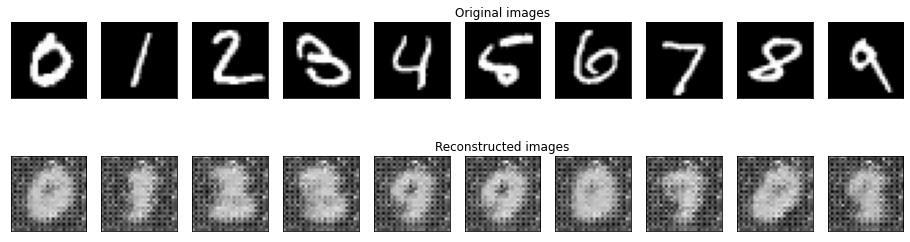

	 partial train loss (single batch): 0.101314
	 partial train loss (single batch): 0.100204
	 partial train loss (single batch): 0.099818

 EPOCH 2/100 	 train loss 0.10044515877962112 	 val loss 0.09778998047113419


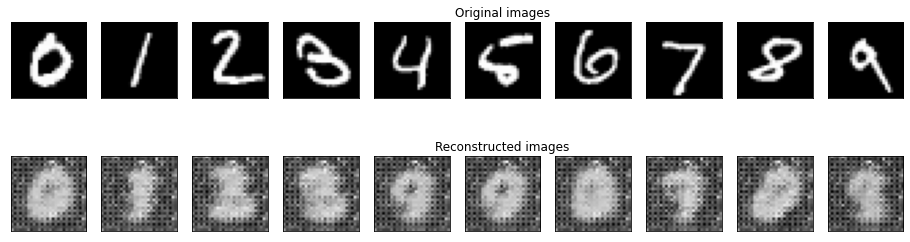

	 partial train loss (single batch): 0.099251
	 partial train loss (single batch): 0.098201
	 partial train loss (single batch): 0.098258

 EPOCH 3/100 	 train loss 0.09856992214918137 	 val loss 0.09591176360845566


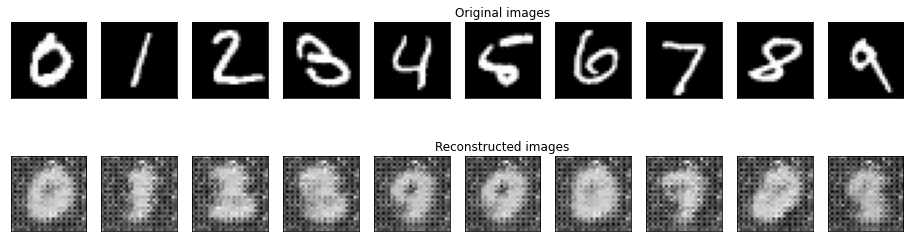

	 partial train loss (single batch): 0.097458
	 partial train loss (single batch): 0.096720
	 partial train loss (single batch): 0.095969

 EPOCH 4/100 	 train loss 0.09671556949615479 	 val loss 0.09365705400705338


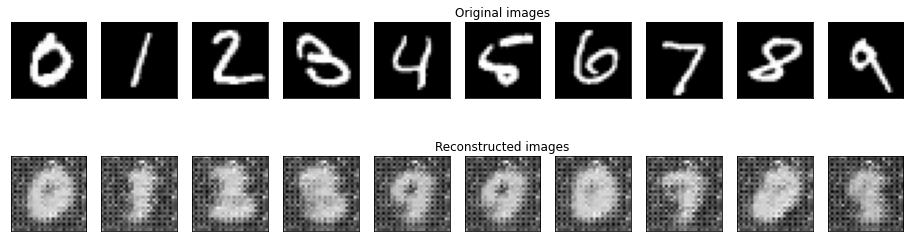

	 partial train loss (single batch): 0.095357
	 partial train loss (single batch): 0.094756
	 partial train loss (single batch): 0.094328

 EPOCH 5/100 	 train loss 0.09481335431337357 	 val loss 0.09228095412254333


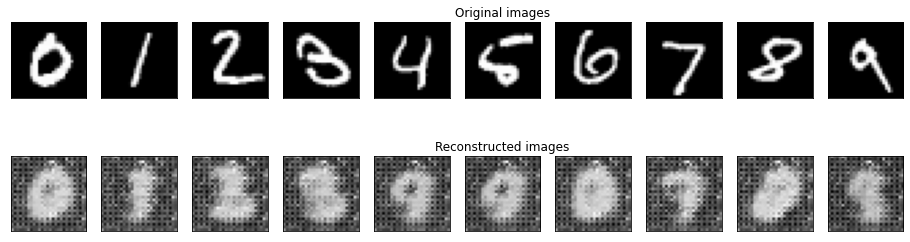

	 partial train loss (single batch): 0.093417
	 partial train loss (single batch): 0.093369
	 partial train loss (single batch): 0.092612

 EPOCH 6/100 	 train loss 0.09313264489173889 	 val loss 0.09101328253746033


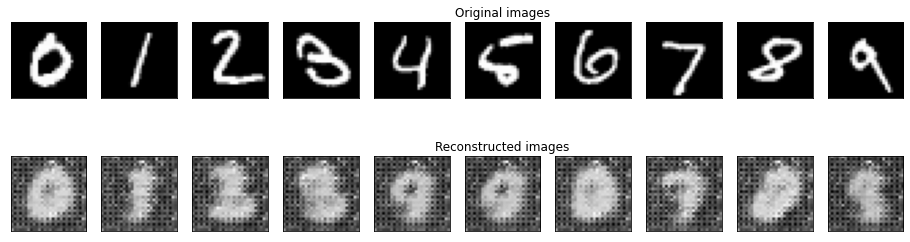

	 partial train loss (single batch): 0.091941
	 partial train loss (single batch): 0.091726
	 partial train loss (single batch): 0.090949

 EPOCH 7/100 	 train loss 0.09153849631547928 	 val loss 0.08909223228693008


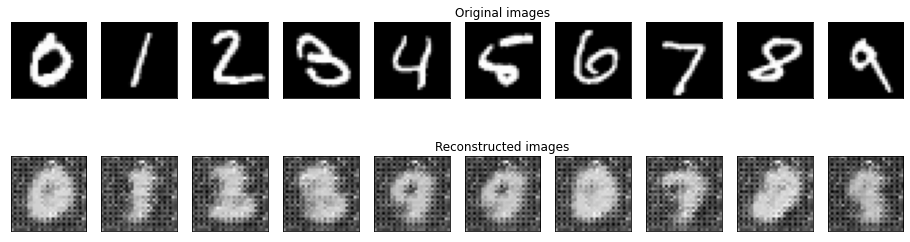

	 partial train loss (single batch): 0.090031
	 partial train loss (single batch): 0.090626
	 partial train loss (single batch): 0.088748

 EPOCH 8/100 	 train loss 0.08980178087949753 	 val loss 0.08743399381637573


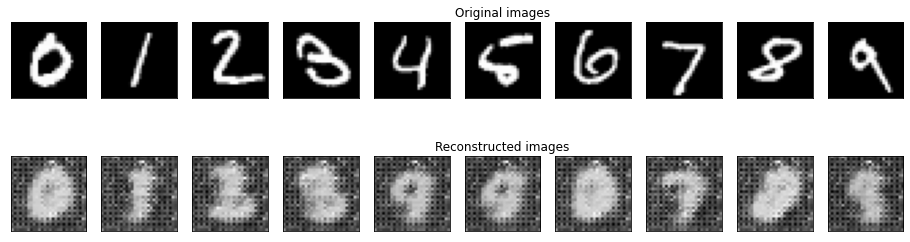

	 partial train loss (single batch): 0.088665
	 partial train loss (single batch): 0.088224
	 partial train loss (single batch): 0.087915

 EPOCH 9/100 	 train loss 0.08826830238103867 	 val loss 0.08610235899686813


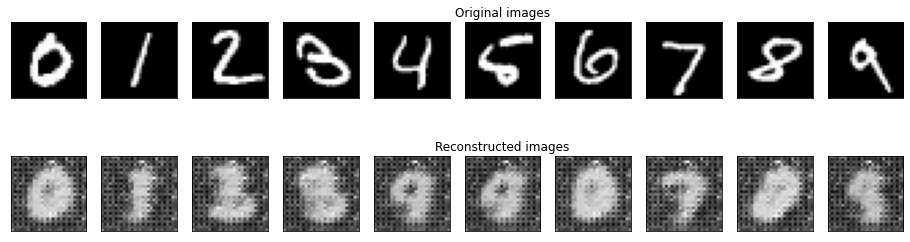

	 partial train loss (single batch): 0.087389
	 partial train loss (single batch): 0.086843
	 partial train loss (single batch): 0.086025

 EPOCH 10/100 	 train loss 0.08675233274698257 	 val loss 0.08462385088205338


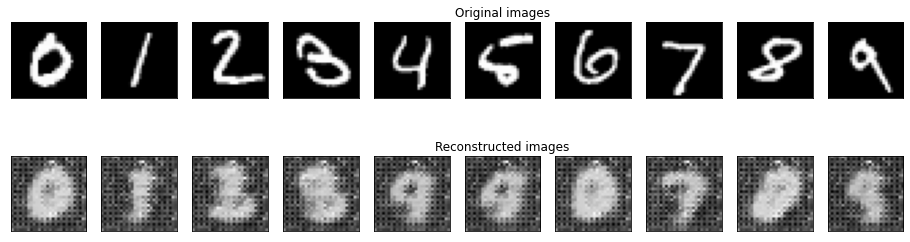

	 partial train loss (single batch): 0.085845
	 partial train loss (single batch): 0.085722
	 partial train loss (single batch): 0.084505

 EPOCH 11/100 	 train loss 0.08535704761743546 	 val loss 0.08337708562612534


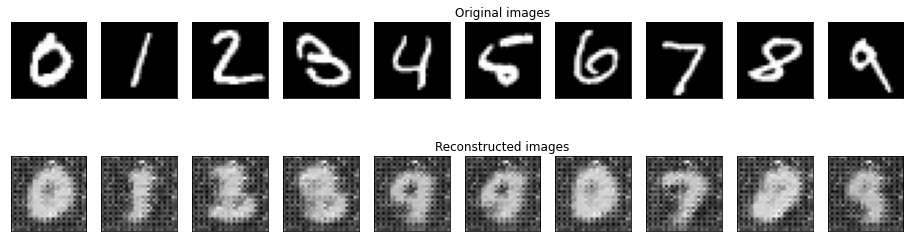

	 partial train loss (single batch): 0.084674
	 partial train loss (single batch): 0.084023
	 partial train loss (single batch): 0.083395

 EPOCH 12/100 	 train loss 0.08403080701828003 	 val loss 0.08188743144273758


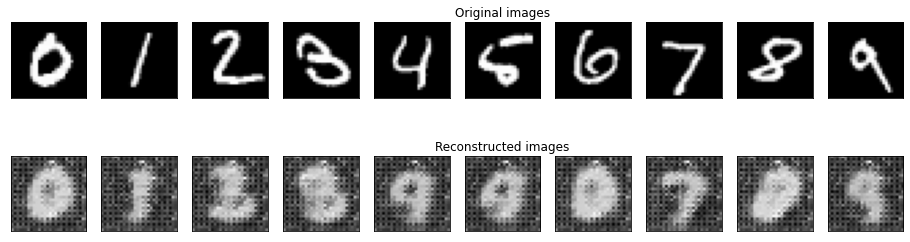

	 partial train loss (single batch): 0.083111
	 partial train loss (single batch): 0.082455
	 partial train loss (single batch): 0.082512

 EPOCH 13/100 	 train loss 0.08269258588552475 	 val loss 0.08073896169662476


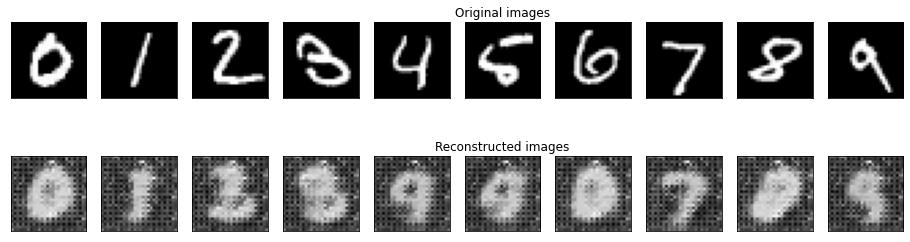

	 partial train loss (single batch): 0.082214
	 partial train loss (single batch): 0.081656
	 partial train loss (single batch): 0.080263

 EPOCH 14/100 	 train loss 0.08137765526771545 	 val loss 0.07889673113822937


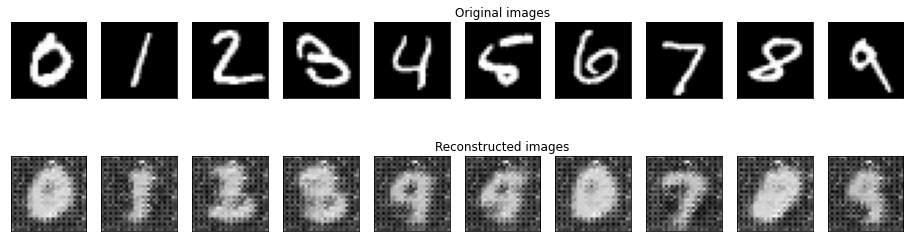

	 partial train loss (single batch): 0.080424
	 partial train loss (single batch): 0.080652
	 partial train loss (single batch): 0.079594

 EPOCH 15/100 	 train loss 0.08022323995828629 	 val loss 0.07785586267709732


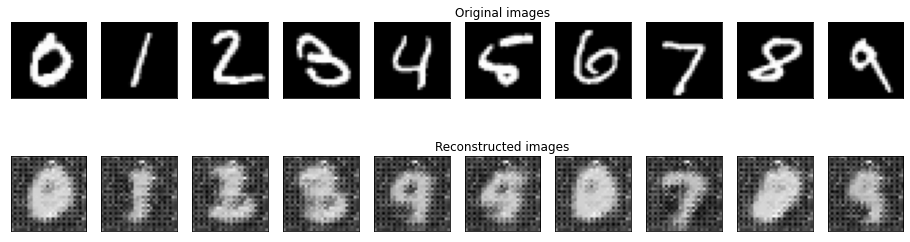

	 partial train loss (single batch): 0.079072
	 partial train loss (single batch): 0.078189
	 partial train loss (single batch): 0.079396

 EPOCH 16/100 	 train loss 0.07888564467430115 	 val loss 0.07748593389987946


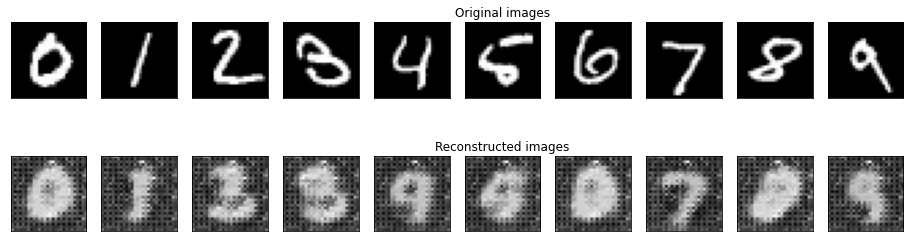

	 partial train loss (single batch): 0.077975
	 partial train loss (single batch): 0.078353
	 partial train loss (single batch): 0.077811

 EPOCH 17/100 	 train loss 0.07804618030786514 	 val loss 0.07605180889368057


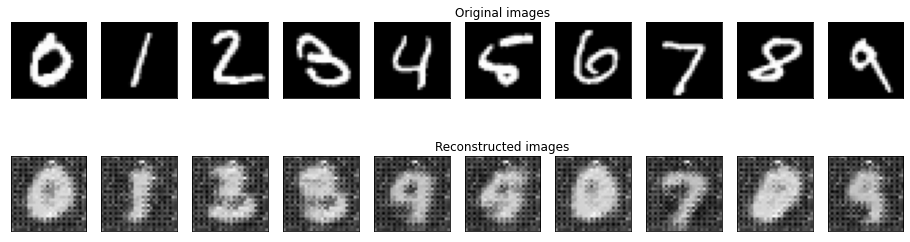

	 partial train loss (single batch): 0.076958
	 partial train loss (single batch): 0.077475
	 partial train loss (single batch): 0.076396

 EPOCH 18/100 	 train loss 0.0769428238272667 	 val loss 0.07530826330184937


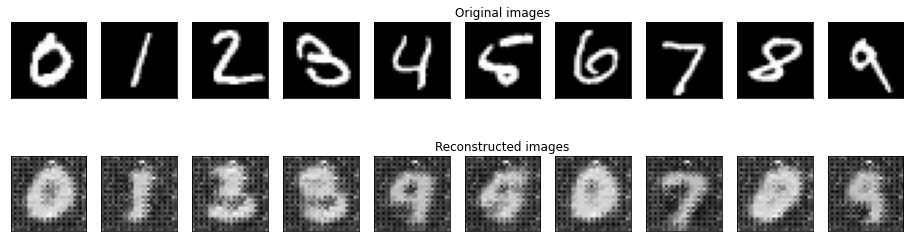

	 partial train loss (single batch): 0.075594
	 partial train loss (single batch): 0.075638
	 partial train loss (single batch): 0.075542

 EPOCH 19/100 	 train loss 0.07559141516685486 	 val loss 0.07430049031972885


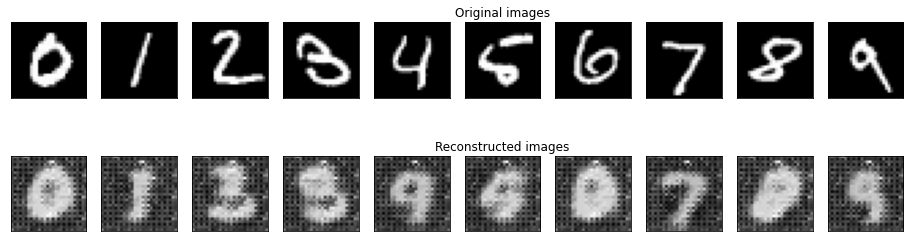

	 partial train loss (single batch): 0.074535
	 partial train loss (single batch): 0.075006
	 partial train loss (single batch): 0.074237

 EPOCH 20/100 	 train loss 0.0745929479598999 	 val loss 0.07261403650045395


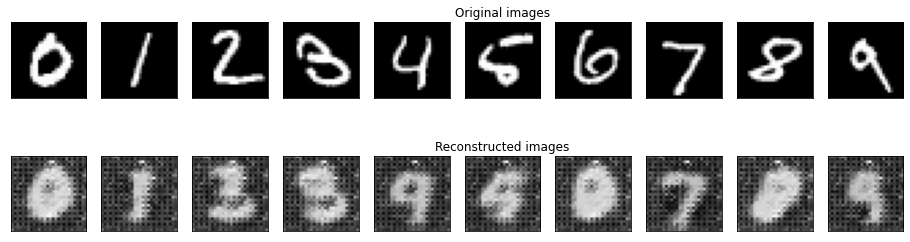

	 partial train loss (single batch): 0.074144
	 partial train loss (single batch): 0.072938
	 partial train loss (single batch): 0.072970

 EPOCH 21/100 	 train loss 0.07335058599710464 	 val loss 0.07189727574586868


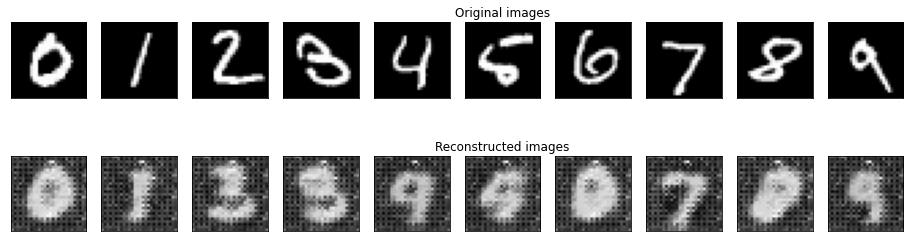

	 partial train loss (single batch): 0.072267
	 partial train loss (single batch): 0.073865
	 partial train loss (single batch): 0.072129

 EPOCH 22/100 	 train loss 0.07275332510471344 	 val loss 0.07143750786781311


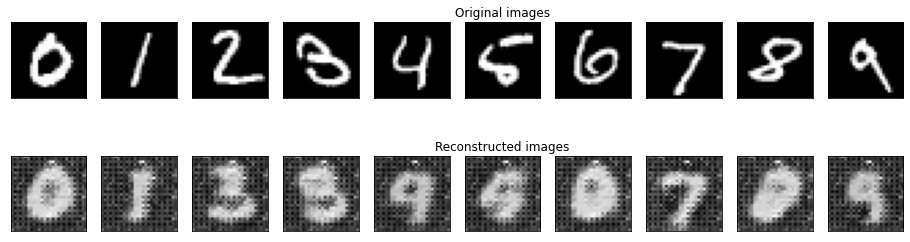

	 partial train loss (single batch): 0.071850
	 partial train loss (single batch): 0.072009
	 partial train loss (single batch): 0.070994

 EPOCH 23/100 	 train loss 0.07161767035722733 	 val loss 0.07028084248304367


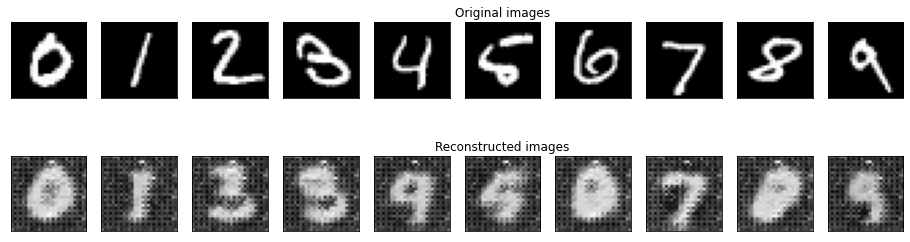

	 partial train loss (single batch): 0.070737
	 partial train loss (single batch): 0.070387
	 partial train loss (single batch): 0.070555

 EPOCH 24/100 	 train loss 0.07055959850549698 	 val loss 0.06951631605625153


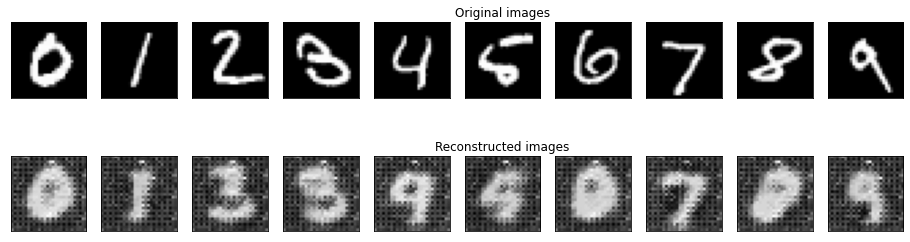

	 partial train loss (single batch): 0.070136
	 partial train loss (single batch): 0.069266
	 partial train loss (single batch): 0.070213

 EPOCH 25/100 	 train loss 0.06987167149782181 	 val loss 0.06877119839191437


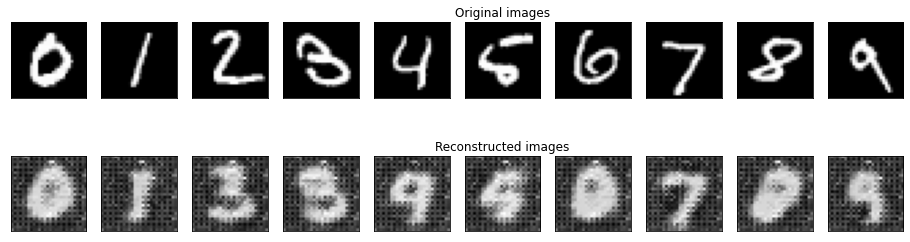

	 partial train loss (single batch): 0.069796
	 partial train loss (single batch): 0.069000
	 partial train loss (single batch): 0.068579

 EPOCH 26/100 	 train loss 0.06912511587142944 	 val loss 0.06784473359584808


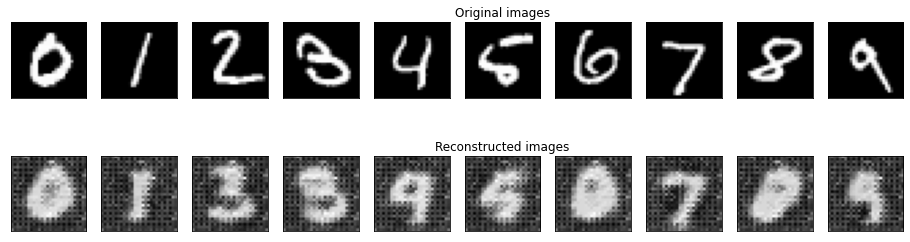

	 partial train loss (single batch): 0.068189
	 partial train loss (single batch): 0.067789
	 partial train loss (single batch): 0.067824

 EPOCH 27/100 	 train loss 0.06793391704559326 	 val loss 0.06694473326206207


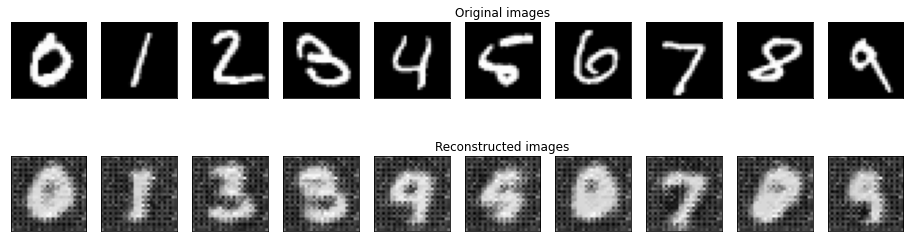

	 partial train loss (single batch): 0.067445
	 partial train loss (single batch): 0.067467
	 partial train loss (single batch): 0.066449

 EPOCH 28/100 	 train loss 0.06712024658918381 	 val loss 0.06610269844532013


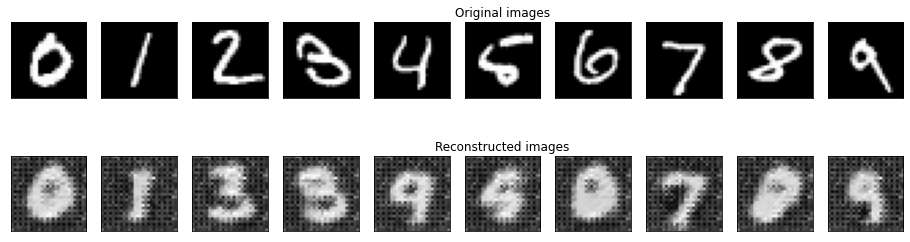

	 partial train loss (single batch): 0.067649
	 partial train loss (single batch): 0.066069
	 partial train loss (single batch): 0.065427

 EPOCH 29/100 	 train loss 0.06638174504041672 	 val loss 0.06540294736623764


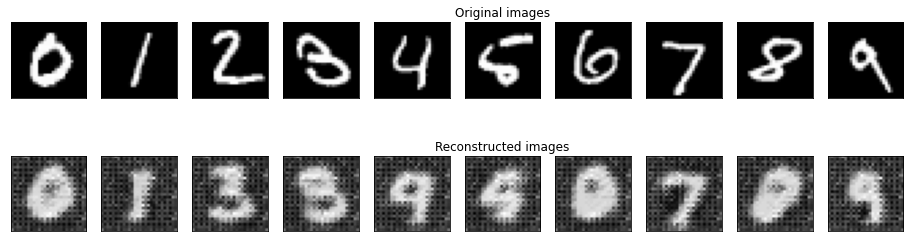

	 partial train loss (single batch): 0.066121
	 partial train loss (single batch): 0.064696
	 partial train loss (single batch): 0.066449

 EPOCH 30/100 	 train loss 0.06575537472963333 	 val loss 0.06489795446395874


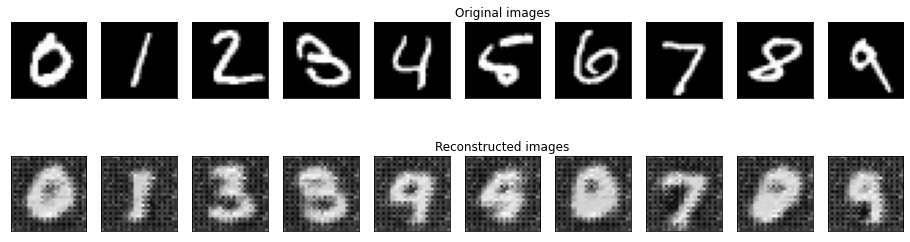

	 partial train loss (single batch): 0.065605
	 partial train loss (single batch): 0.064885
	 partial train loss (single batch): 0.064578

 EPOCH 31/100 	 train loss 0.06502259522676468 	 val loss 0.06421224027872086


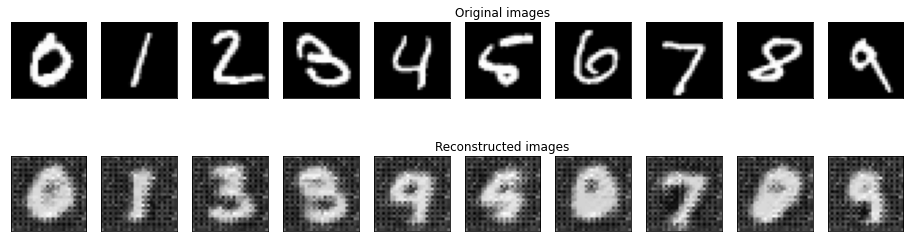

	 partial train loss (single batch): 0.064445
	 partial train loss (single batch): 0.064447
	 partial train loss (single batch): 0.064439

 EPOCH 32/100 	 train loss 0.06444378942251205 	 val loss 0.0638352707028389


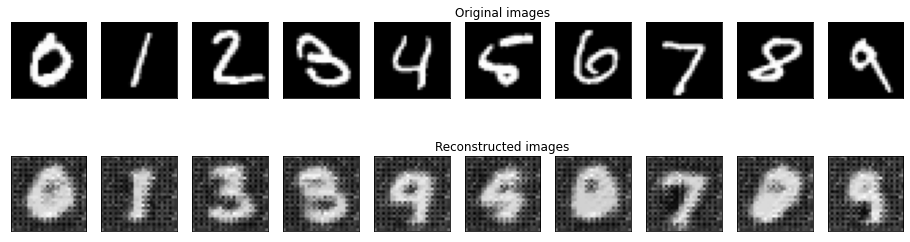

	 partial train loss (single batch): 0.064276
	 partial train loss (single batch): 0.063142
	 partial train loss (single batch): 0.063062

 EPOCH 33/100 	 train loss 0.06349315494298935 	 val loss 0.06314709782600403


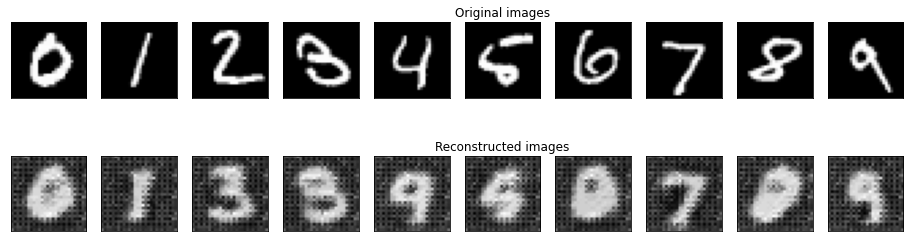

	 partial train loss (single batch): 0.063671
	 partial train loss (single batch): 0.062326
	 partial train loss (single batch): 0.062261

 EPOCH 34/100 	 train loss 0.06275276839733124 	 val loss 0.06275808811187744


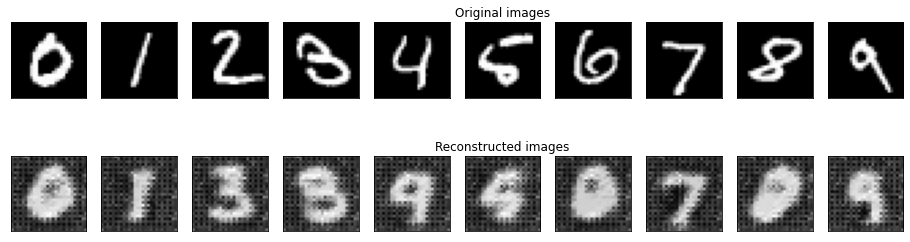

	 partial train loss (single batch): 0.062348
	 partial train loss (single batch): 0.061999
	 partial train loss (single batch): 0.062012

 EPOCH 35/100 	 train loss 0.062119510024785995 	 val loss 0.06226515397429466


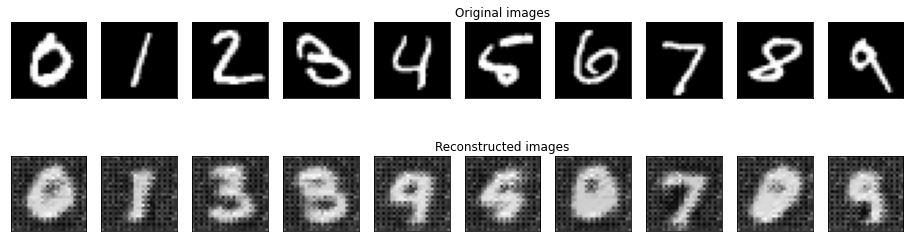

	 partial train loss (single batch): 0.061854
	 partial train loss (single batch): 0.061537
	 partial train loss (single batch): 0.061552

 EPOCH 36/100 	 train loss 0.061647575348615646 	 val loss 0.06182273477315903


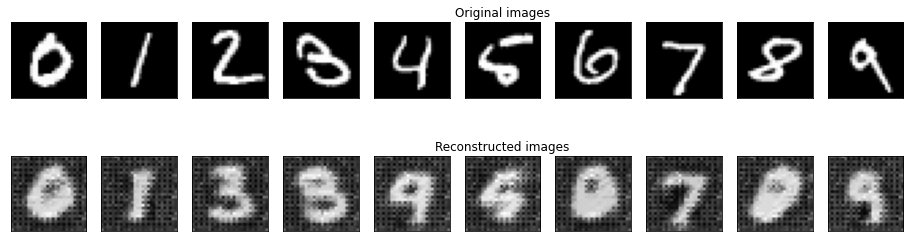

	 partial train loss (single batch): 0.061826
	 partial train loss (single batch): 0.060852
	 partial train loss (single batch): 0.060864

 EPOCH 37/100 	 train loss 0.061180684715509415 	 val loss 0.061341892927885056


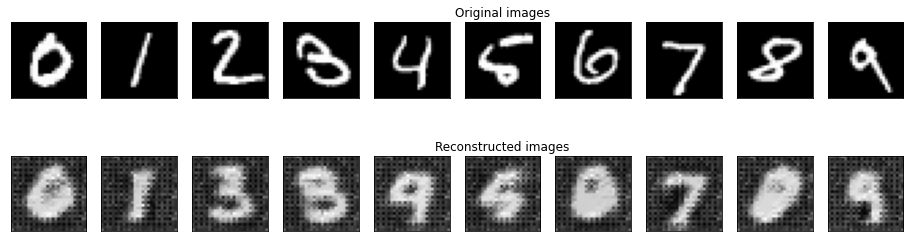

	 partial train loss (single batch): 0.060974
	 partial train loss (single batch): 0.060328
	 partial train loss (single batch): 0.059683

 EPOCH 38/100 	 train loss 0.06032843887805939 	 val loss 0.060694918036460876


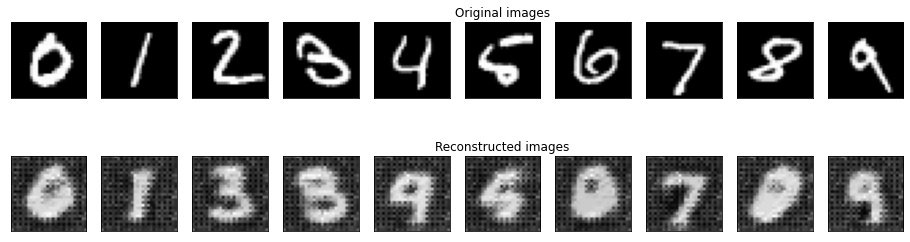

	 partial train loss (single batch): 0.060895
	 partial train loss (single batch): 0.059972
	 partial train loss (single batch): 0.058963

 EPOCH 39/100 	 train loss 0.05994328856468201 	 val loss 0.060194678604602814


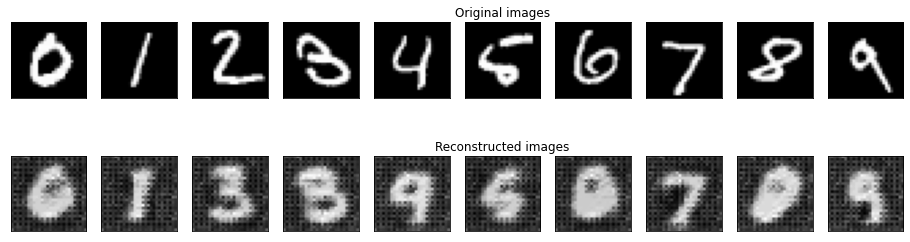

	 partial train loss (single batch): 0.059656
	 partial train loss (single batch): 0.060360
	 partial train loss (single batch): 0.058578

 EPOCH 40/100 	 train loss 0.05953115224838257 	 val loss 0.0597548633813858


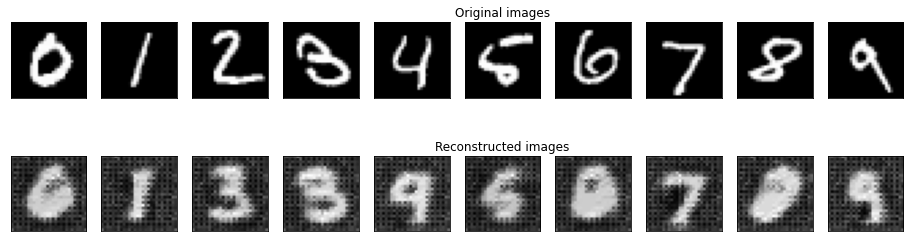

	 partial train loss (single batch): 0.060172
	 partial train loss (single batch): 0.058545
	 partial train loss (single batch): 0.057897

 EPOCH 41/100 	 train loss 0.05887112393975258 	 val loss 0.059290144592523575


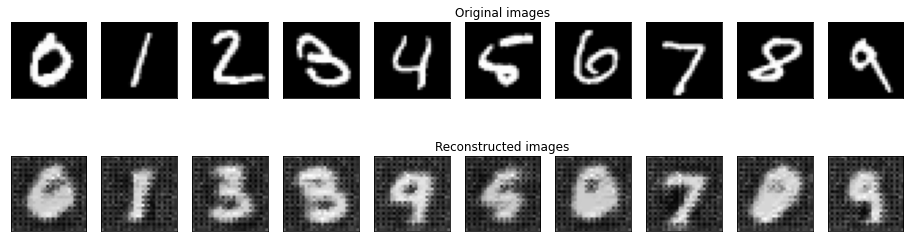

	 partial train loss (single batch): 0.058586
	 partial train loss (single batch): 0.058886
	 partial train loss (single batch): 0.058232

 EPOCH 42/100 	 train loss 0.05856785178184509 	 val loss 0.05882822722196579


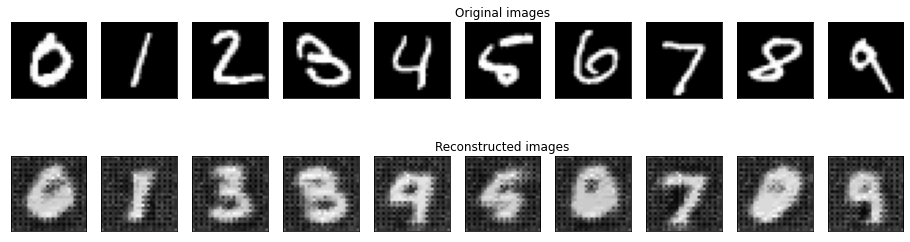

	 partial train loss (single batch): 0.057939
	 partial train loss (single batch): 0.057469
	 partial train loss (single batch): 0.057654

 EPOCH 43/100 	 train loss 0.057687342166900635 	 val loss 0.05856221541762352


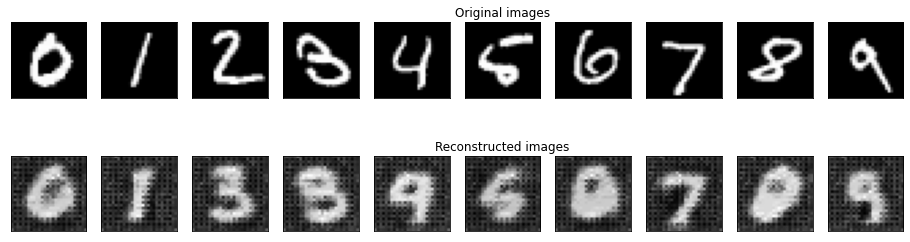

	 partial train loss (single batch): 0.057079
	 partial train loss (single batch): 0.057488
	 partial train loss (single batch): 0.057460

 EPOCH 44/100 	 train loss 0.05734243988990784 	 val loss 0.05795478820800781


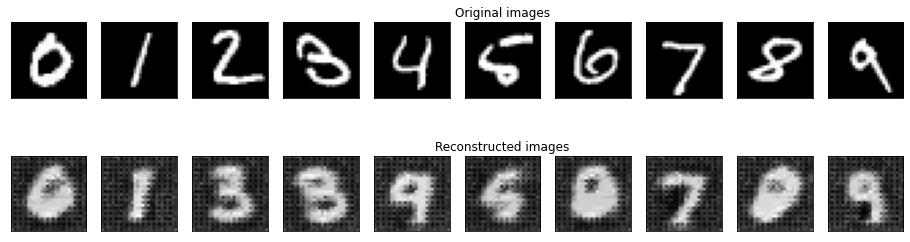

	 partial train loss (single batch): 0.057829
	 partial train loss (single batch): 0.056574
	 partial train loss (single batch): 0.056434

 EPOCH 45/100 	 train loss 0.05694574490189552 	 val loss 0.05767405405640602


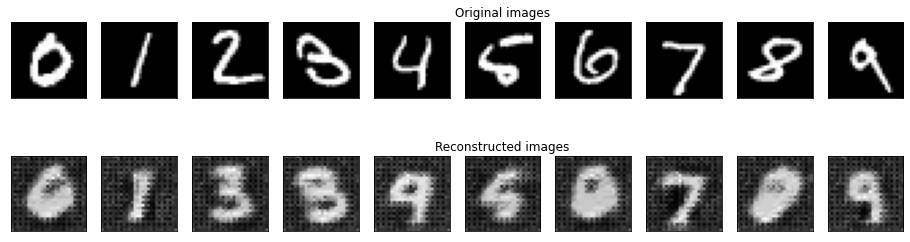

	 partial train loss (single batch): 0.055638
	 partial train loss (single batch): 0.057021
	 partial train loss (single batch): 0.057255

 EPOCH 46/100 	 train loss 0.05663818120956421 	 val loss 0.05735451728105545


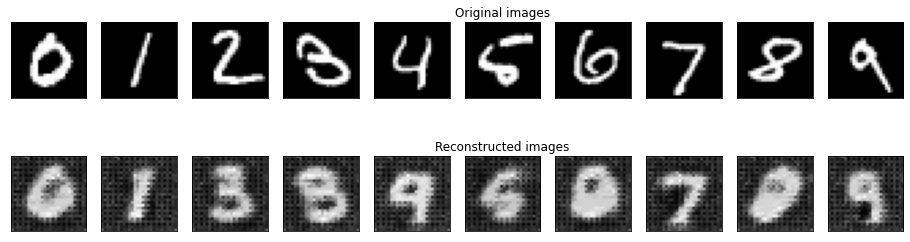

	 partial train loss (single batch): 0.056756
	 partial train loss (single batch): 0.056145
	 partial train loss (single batch): 0.056220

 EPOCH 47/100 	 train loss 0.056373655796051025 	 val loss 0.05706875026226044


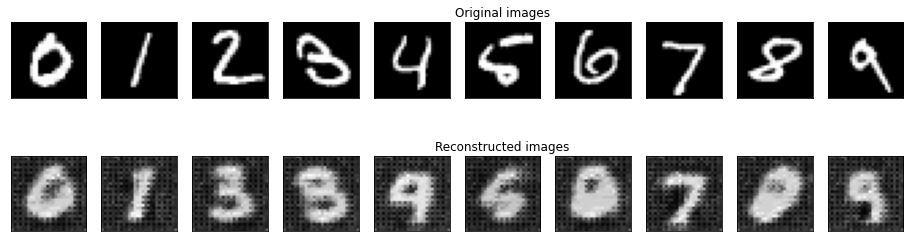

	 partial train loss (single batch): 0.056075
	 partial train loss (single batch): 0.056010
	 partial train loss (single batch): 0.055560

 EPOCH 48/100 	 train loss 0.05588160455226898 	 val loss 0.05640349164605141


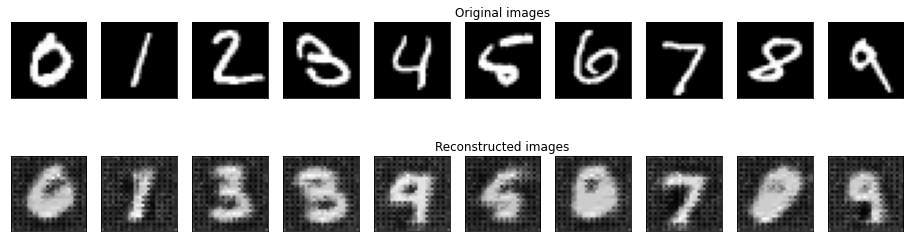

	 partial train loss (single batch): 0.055735
	 partial train loss (single batch): 0.055248
	 partial train loss (single batch): 0.055070

 EPOCH 49/100 	 train loss 0.055350881069898605 	 val loss 0.056166645139455795


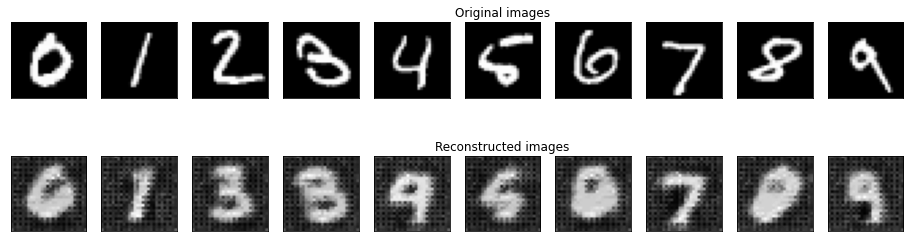

	 partial train loss (single batch): 0.055007
	 partial train loss (single batch): 0.054474
	 partial train loss (single batch): 0.055606

 EPOCH 50/100 	 train loss 0.05502896010875702 	 val loss 0.05626923590898514


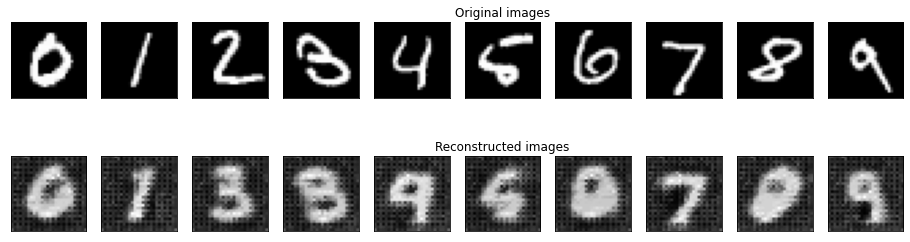

	 partial train loss (single batch): 0.054299
	 partial train loss (single batch): 0.054065
	 partial train loss (single batch): 0.055108

 EPOCH 51/100 	 train loss 0.05449046567082405 	 val loss 0.05562004819512367


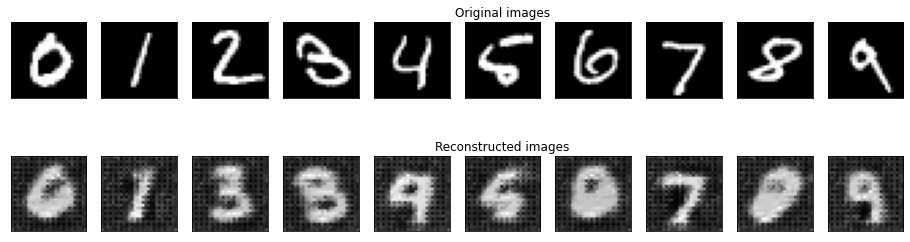

	 partial train loss (single batch): 0.054022
	 partial train loss (single batch): 0.055243
	 partial train loss (single batch): 0.054249

 EPOCH 52/100 	 train loss 0.054504673928022385 	 val loss 0.05502699315547943


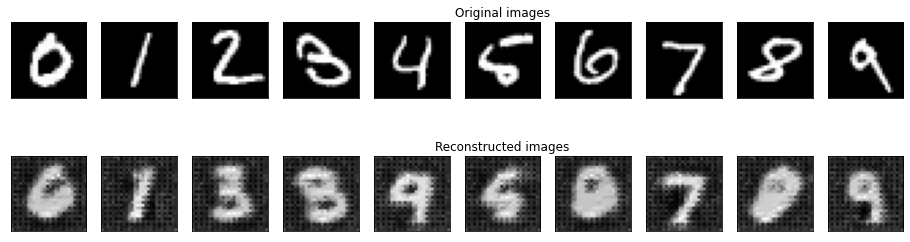

	 partial train loss (single batch): 0.053784
	 partial train loss (single batch): 0.053919
	 partial train loss (single batch): 0.053780

 EPOCH 53/100 	 train loss 0.05382782593369484 	 val loss 0.05532211810350418


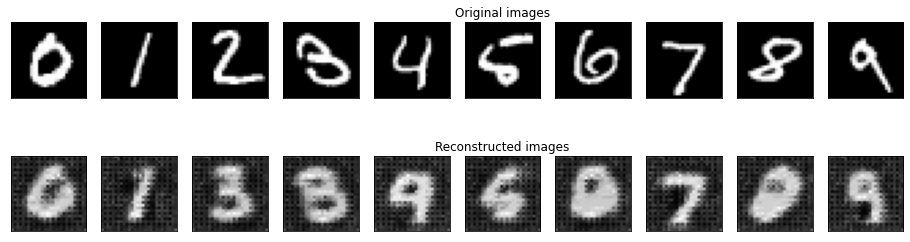

	 partial train loss (single batch): 0.054184
	 partial train loss (single batch): 0.053074
	 partial train loss (single batch): 0.054157

 EPOCH 54/100 	 train loss 0.053805042058229446 	 val loss 0.05475250631570816


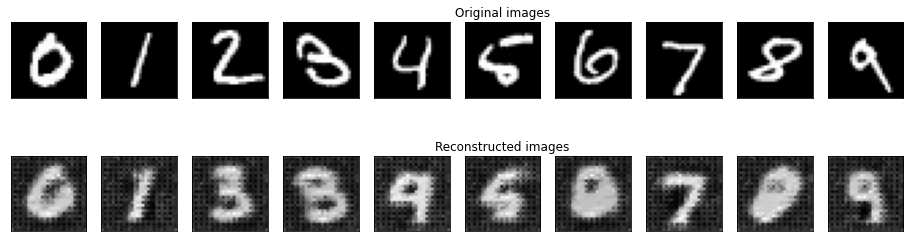

	 partial train loss (single batch): 0.053542
	 partial train loss (single batch): 0.052810
	 partial train loss (single batch): 0.053486

 EPOCH 55/100 	 train loss 0.05327913165092468 	 val loss 0.05450465902686119


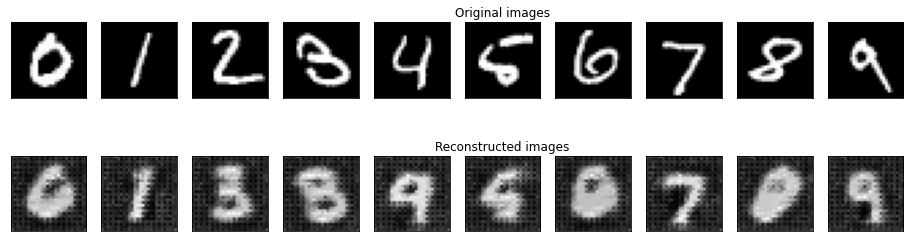

	 partial train loss (single batch): 0.053332
	 partial train loss (single batch): 0.053656
	 partial train loss (single batch): 0.052431

 EPOCH 56/100 	 train loss 0.053139593452215195 	 val loss 0.05431143566966057


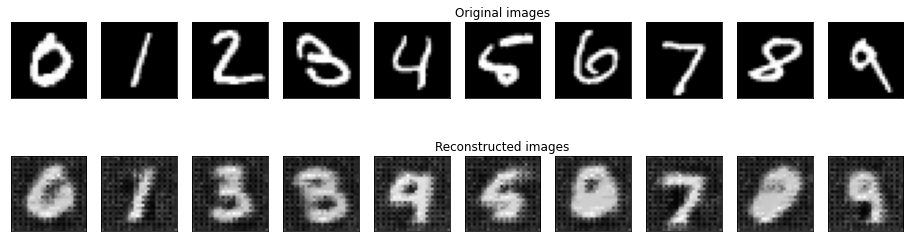

	 partial train loss (single batch): 0.053362
	 partial train loss (single batch): 0.052050
	 partial train loss (single batch): 0.051339

 EPOCH 57/100 	 train loss 0.05225030705332756 	 val loss 0.05419127643108368


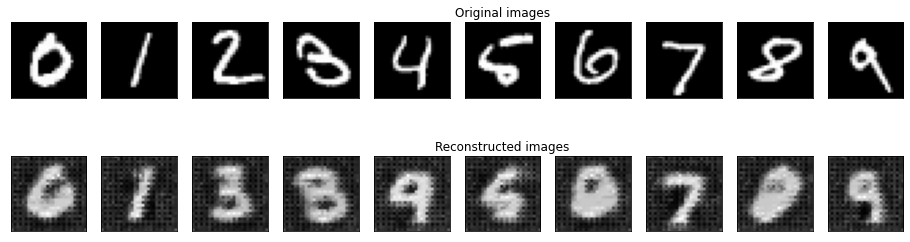

	 partial train loss (single batch): 0.052857
	 partial train loss (single batch): 0.051461
	 partial train loss (single batch): 0.052377

 EPOCH 58/100 	 train loss 0.052231818437576294 	 val loss 0.053689103573560715


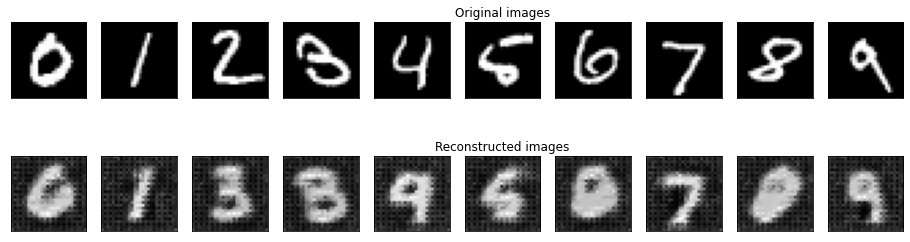

	 partial train loss (single batch): 0.052340
	 partial train loss (single batch): 0.052069
	 partial train loss (single batch): 0.052169

 EPOCH 59/100 	 train loss 0.05219260975718498 	 val loss 0.053629711270332336


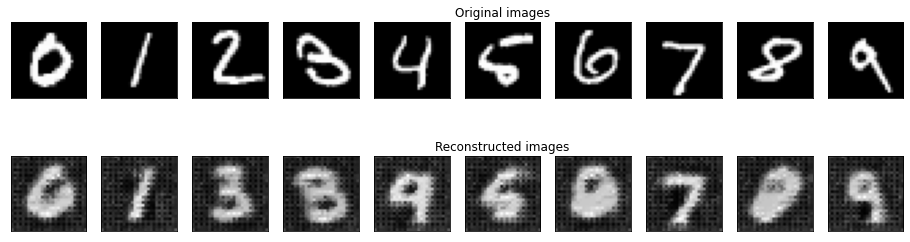

	 partial train loss (single batch): 0.051545
	 partial train loss (single batch): 0.051502
	 partial train loss (single batch): 0.051876

 EPOCH 60/100 	 train loss 0.051640912890434265 	 val loss 0.053539130836725235


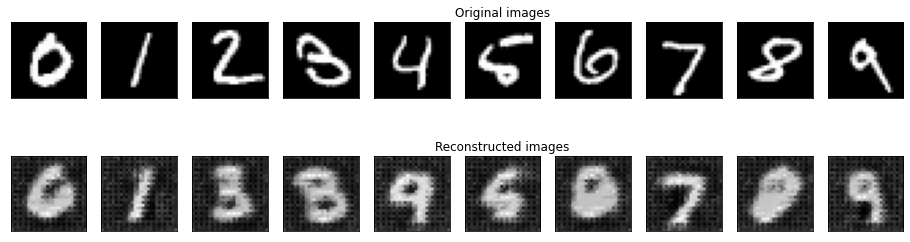

	 partial train loss (single batch): 0.050605
	 partial train loss (single batch): 0.051023
	 partial train loss (single batch): 0.051716

 EPOCH 61/100 	 train loss 0.05111486837267876 	 val loss 0.05347125232219696


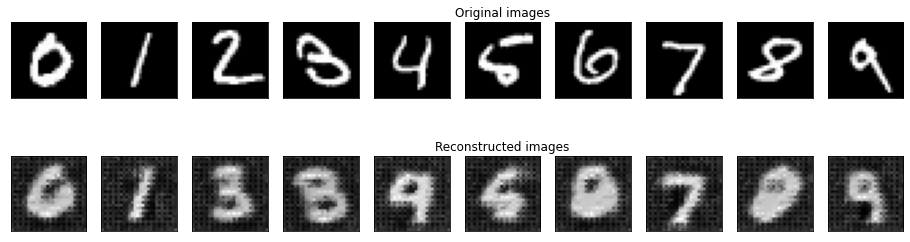

	 partial train loss (single batch): 0.051941
	 partial train loss (single batch): 0.050284
	 partial train loss (single batch): 0.052170

 EPOCH 62/100 	 train loss 0.0514649860560894 	 val loss 0.05312167853116989


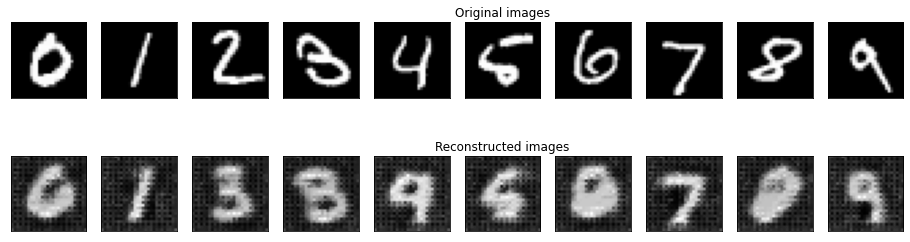

	 partial train loss (single batch): 0.050537
	 partial train loss (single batch): 0.050320
	 partial train loss (single batch): 0.052320

 EPOCH 63/100 	 train loss 0.05105915293097496 	 val loss 0.05272405594587326


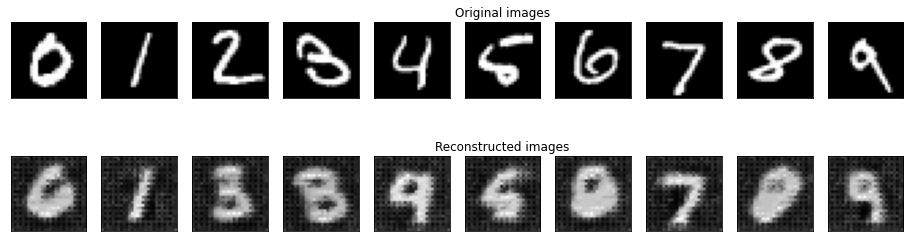

	 partial train loss (single batch): 0.051025
	 partial train loss (single batch): 0.050258
	 partial train loss (single batch): 0.050809

 EPOCH 64/100 	 train loss 0.05069762095808983 	 val loss 0.05241844058036804


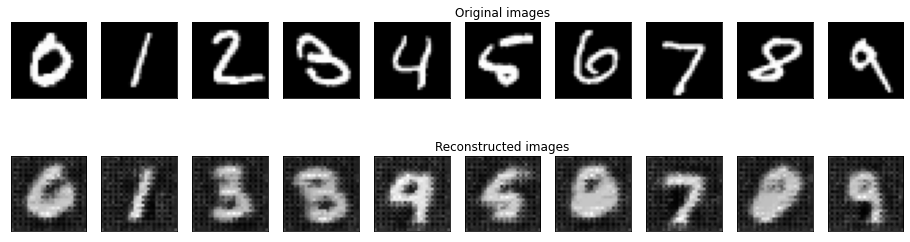

	 partial train loss (single batch): 0.049891
	 partial train loss (single batch): 0.050679
	 partial train loss (single batch): 0.050844

 EPOCH 65/100 	 train loss 0.050471413880586624 	 val loss 0.0524415597319603


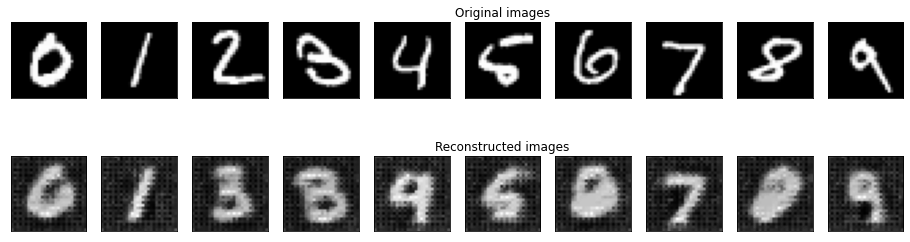

	 partial train loss (single batch): 0.050880
	 partial train loss (single batch): 0.050161
	 partial train loss (single batch): 0.049903

 EPOCH 66/100 	 train loss 0.050314709544181824 	 val loss 0.05216846615076065


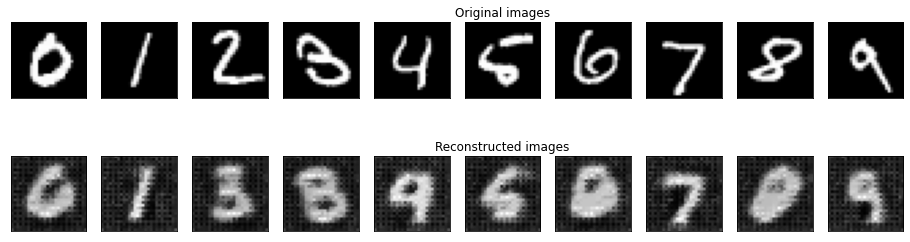

	 partial train loss (single batch): 0.049804
	 partial train loss (single batch): 0.049404
	 partial train loss (single batch): 0.050654

 EPOCH 67/100 	 train loss 0.04995431378483772 	 val loss 0.05202358588576317


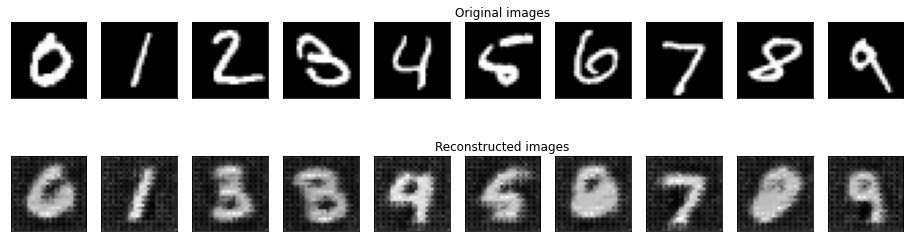

	 partial train loss (single batch): 0.049666
	 partial train loss (single batch): 0.050180
	 partial train loss (single batch): 0.050589

 EPOCH 68/100 	 train loss 0.05014520883560181 	 val loss 0.05184507369995117


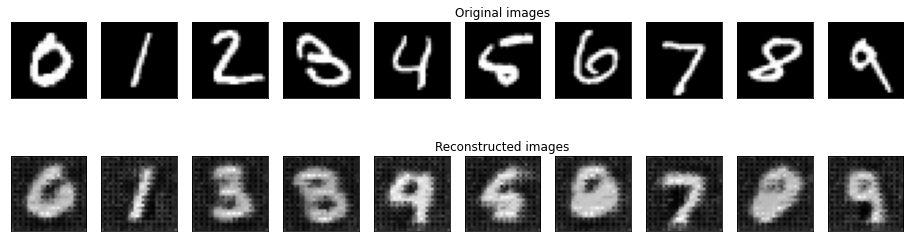

	 partial train loss (single batch): 0.049426
	 partial train loss (single batch): 0.049636
	 partial train loss (single batch): 0.049751

 EPOCH 69/100 	 train loss 0.04960428178310394 	 val loss 0.05191405117511749


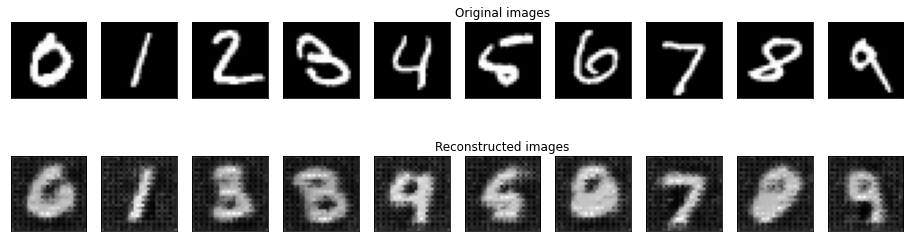

	 partial train loss (single batch): 0.049179
	 partial train loss (single batch): 0.048980
	 partial train loss (single batch): 0.048948

 EPOCH 70/100 	 train loss 0.04903574660420418 	 val loss 0.05160139873623848


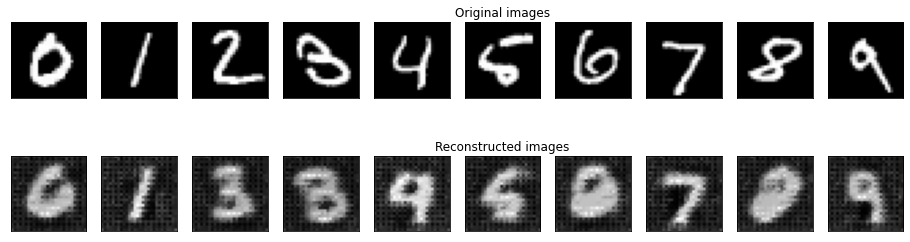

	 partial train loss (single batch): 0.048729
	 partial train loss (single batch): 0.048197
	 partial train loss (single batch): 0.049786

 EPOCH 71/100 	 train loss 0.048904065042734146 	 val loss 0.05113813281059265


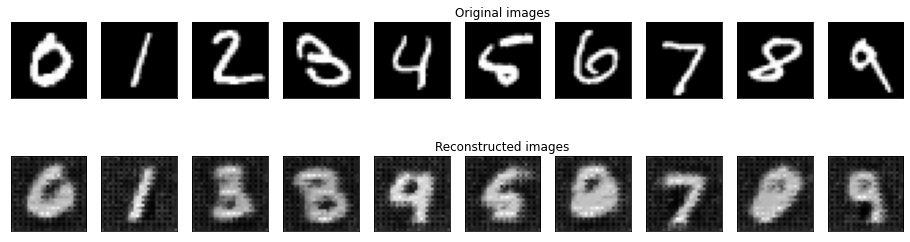

	 partial train loss (single batch): 0.050166
	 partial train loss (single batch): 0.048660
	 partial train loss (single batch): 0.047938

 EPOCH 72/100 	 train loss 0.04892154410481453 	 val loss 0.05102412402629852


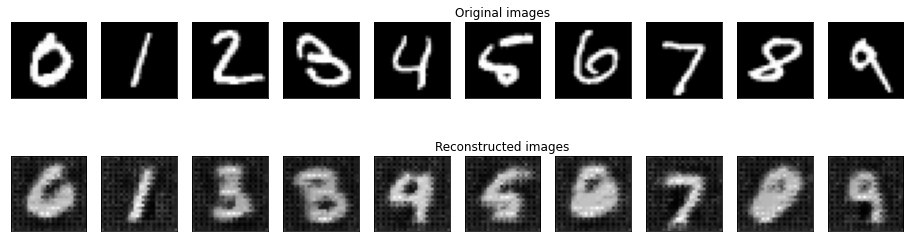

	 partial train loss (single batch): 0.049560
	 partial train loss (single batch): 0.048561
	 partial train loss (single batch): 0.048527

 EPOCH 73/100 	 train loss 0.04888289049267769 	 val loss 0.050644271075725555


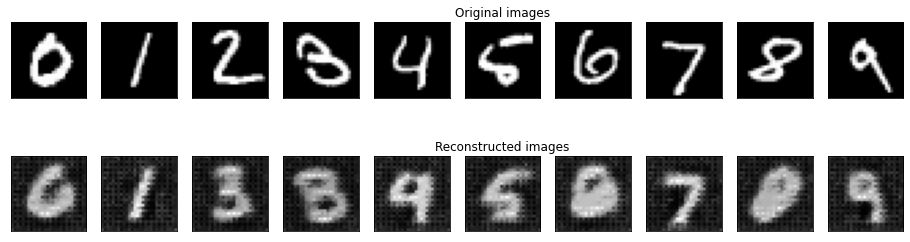

	 partial train loss (single batch): 0.048570
	 partial train loss (single batch): 0.047848
	 partial train loss (single batch): 0.049884

 EPOCH 74/100 	 train loss 0.04876720532774925 	 val loss 0.05082443729043007


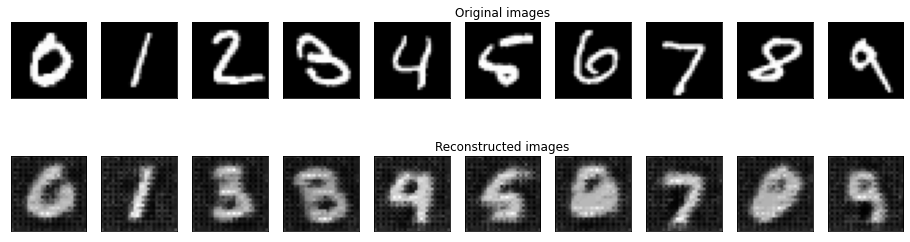

	 partial train loss (single batch): 0.048152
	 partial train loss (single batch): 0.047679
	 partial train loss (single batch): 0.048953

 EPOCH 75/100 	 train loss 0.04826144501566887 	 val loss 0.050431739538908005


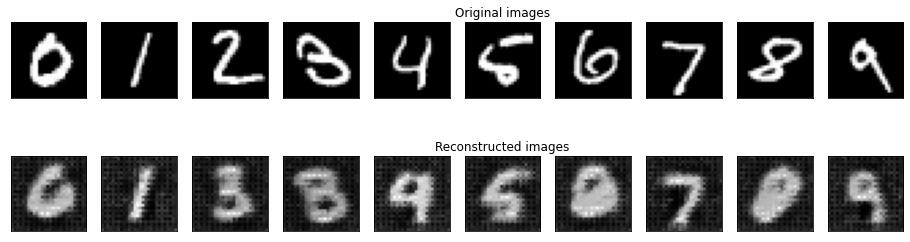

	 partial train loss (single batch): 0.047972
	 partial train loss (single batch): 0.048366
	 partial train loss (single batch): 0.047958

 EPOCH 76/100 	 train loss 0.04809887334704399 	 val loss 0.05013119429349899


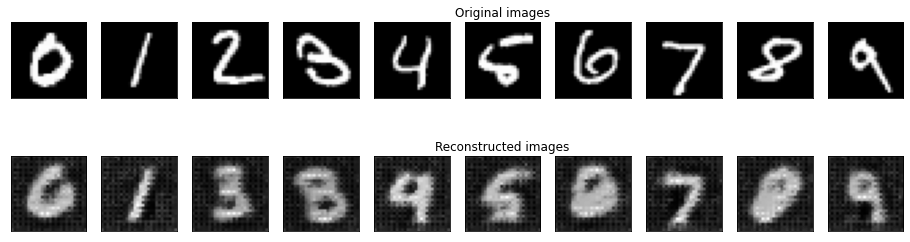

	 partial train loss (single batch): 0.047813
	 partial train loss (single batch): 0.047662
	 partial train loss (single batch): 0.047753

 EPOCH 77/100 	 train loss 0.04774264618754387 	 val loss 0.05024130642414093


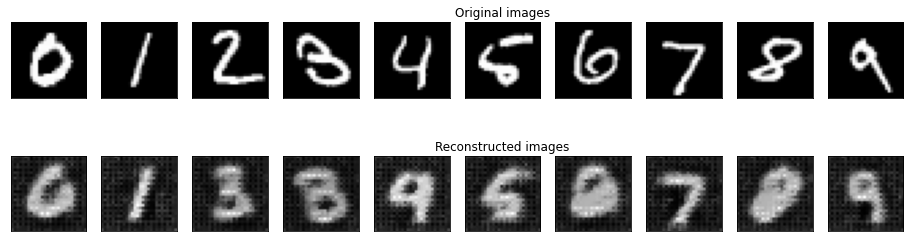

	 partial train loss (single batch): 0.048434
	 partial train loss (single batch): 0.046940
	 partial train loss (single batch): 0.047222

 EPOCH 78/100 	 train loss 0.04753214493393898 	 val loss 0.049878913909196854


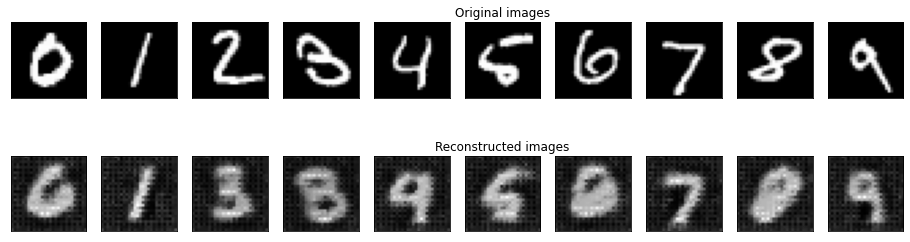

	 partial train loss (single batch): 0.046903
	 partial train loss (single batch): 0.047842
	 partial train loss (single batch): 0.048175

 EPOCH 79/100 	 train loss 0.04763995483517647 	 val loss 0.04974763095378876


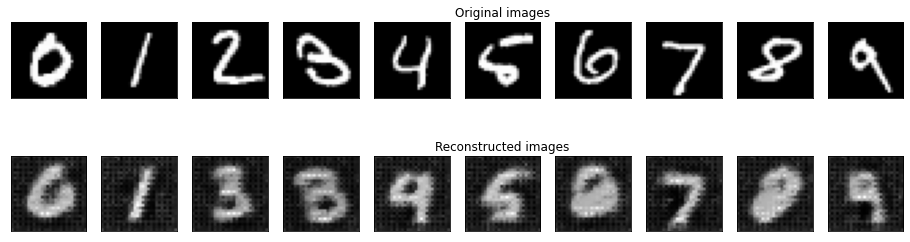

	 partial train loss (single batch): 0.046346
	 partial train loss (single batch): 0.046748
	 partial train loss (single batch): 0.047379

 EPOCH 80/100 	 train loss 0.04682442173361778 	 val loss 0.0495397113263607


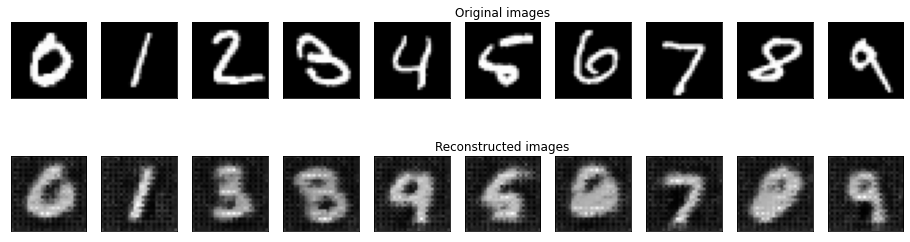

	 partial train loss (single batch): 0.047764
	 partial train loss (single batch): 0.046133
	 partial train loss (single batch): 0.046231

 EPOCH 81/100 	 train loss 0.04670935869216919 	 val loss 0.04953016713261604


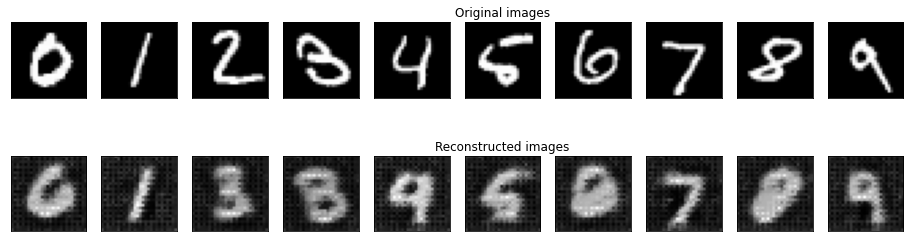

	 partial train loss (single batch): 0.046204
	 partial train loss (single batch): 0.046380
	 partial train loss (single batch): 0.046428

 EPOCH 82/100 	 train loss 0.04633716866374016 	 val loss 0.04930853843688965


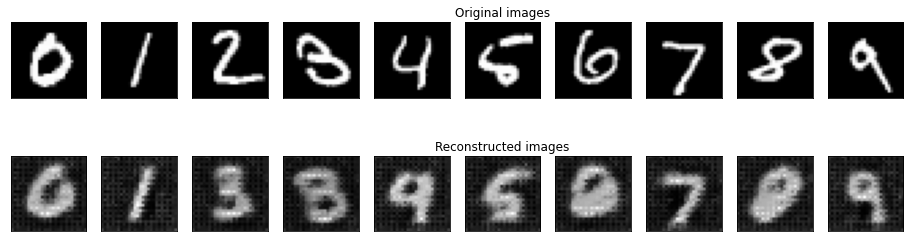

	 partial train loss (single batch): 0.046946
	 partial train loss (single batch): 0.045980
	 partial train loss (single batch): 0.046649

 EPOCH 83/100 	 train loss 0.04652509093284607 	 val loss 0.04954805225133896


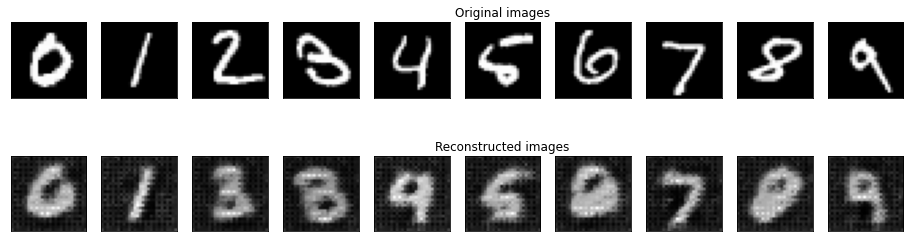

	 partial train loss (single batch): 0.047635
	 partial train loss (single batch): 0.045044
	 partial train loss (single batch): 0.045986

 EPOCH 84/100 	 train loss 0.04622187092900276 	 val loss 0.048967212438583374


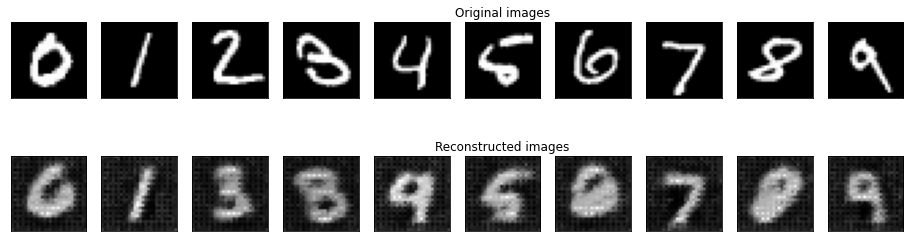

	 partial train loss (single batch): 0.046435
	 partial train loss (single batch): 0.045123
	 partial train loss (single batch): 0.046993

 EPOCH 85/100 	 train loss 0.046183567494153976 	 val loss 0.04877188801765442


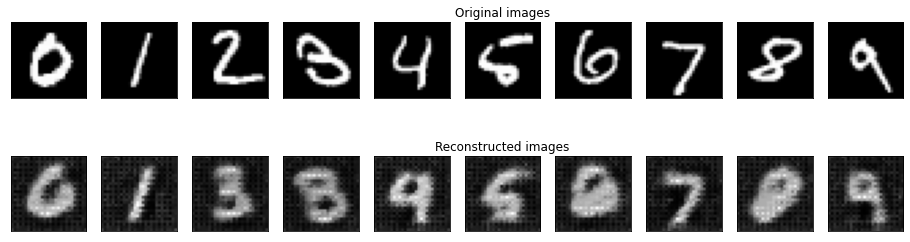

	 partial train loss (single batch): 0.046486
	 partial train loss (single batch): 0.045966
	 partial train loss (single batch): 0.046044

 EPOCH 86/100 	 train loss 0.04616517946124077 	 val loss 0.04859372600913048


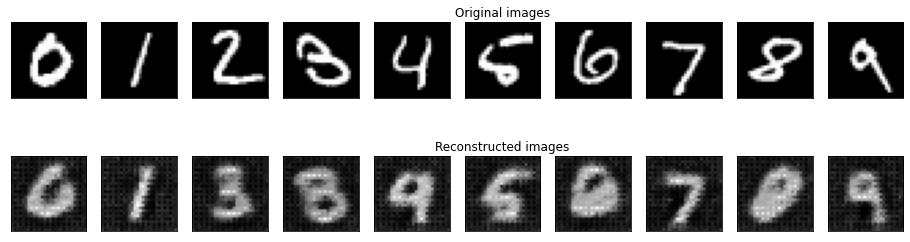

	 partial train loss (single batch): 0.046077
	 partial train loss (single batch): 0.044824
	 partial train loss (single batch): 0.045994

 EPOCH 87/100 	 train loss 0.04563145712018013 	 val loss 0.048525240272283554


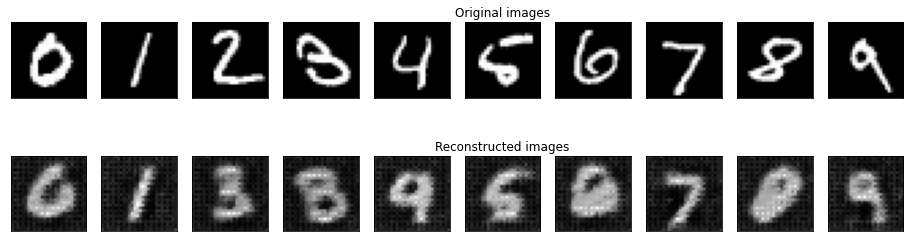

	 partial train loss (single batch): 0.046402
	 partial train loss (single batch): 0.044275
	 partial train loss (single batch): 0.046171

 EPOCH 88/100 	 train loss 0.04561595246195793 	 val loss 0.04817895591259003


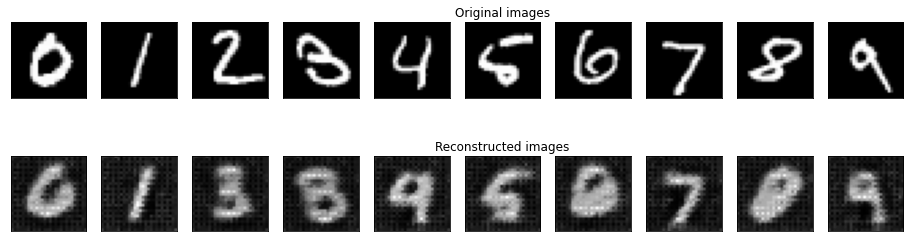

	 partial train loss (single batch): 0.045591
	 partial train loss (single batch): 0.045726
	 partial train loss (single batch): 0.044170

 EPOCH 89/100 	 train loss 0.04516211152076721 	 val loss 0.04808846116065979


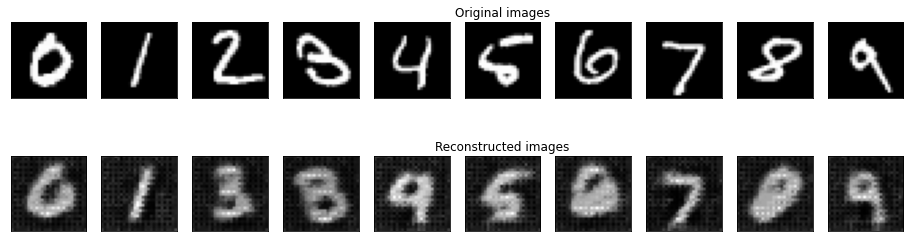

	 partial train loss (single batch): 0.045246
	 partial train loss (single batch): 0.045005
	 partial train loss (single batch): 0.044339

 EPOCH 90/100 	 train loss 0.04486347734928131 	 val loss 0.04821699112653732


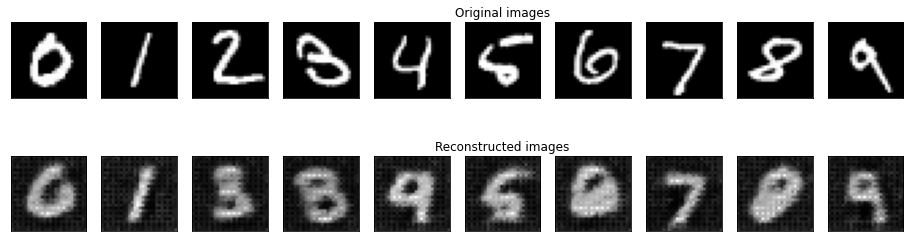

	 partial train loss (single batch): 0.044826
	 partial train loss (single batch): 0.044545
	 partial train loss (single batch): 0.044977

 EPOCH 91/100 	 train loss 0.0447828434407711 	 val loss 0.04805418848991394


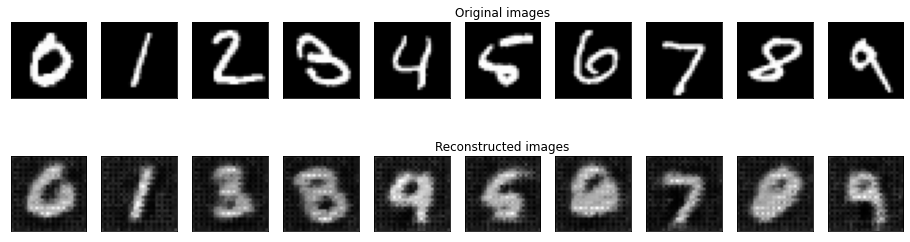

	 partial train loss (single batch): 0.044367
	 partial train loss (single batch): 0.044429
	 partial train loss (single batch): 0.045298

 EPOCH 92/100 	 train loss 0.044698163866996765 	 val loss 0.04757806286215782


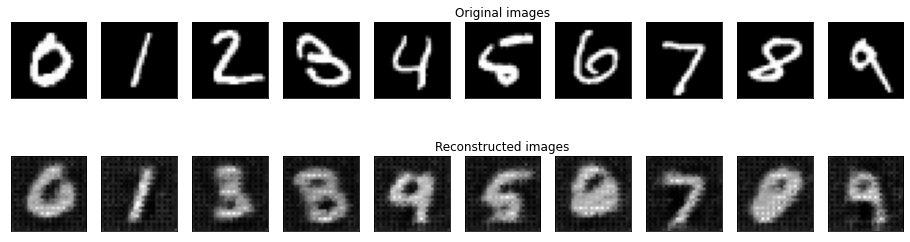

	 partial train loss (single batch): 0.043947
	 partial train loss (single batch): 0.044330
	 partial train loss (single batch): 0.045214

 EPOCH 93/100 	 train loss 0.04449686035513878 	 val loss 0.04727543145418167


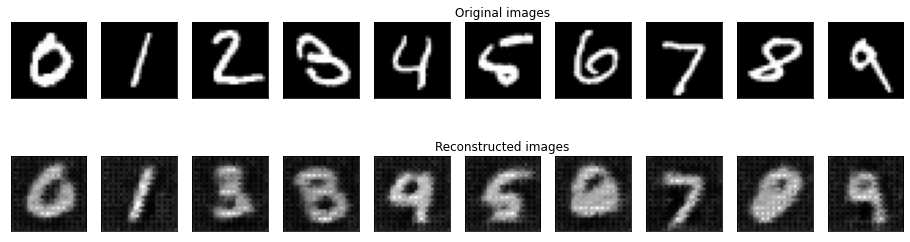

	 partial train loss (single batch): 0.044904
	 partial train loss (single batch): 0.043648
	 partial train loss (single batch): 0.043345

 EPOCH 94/100 	 train loss 0.043965358287096024 	 val loss 0.04720239341259003


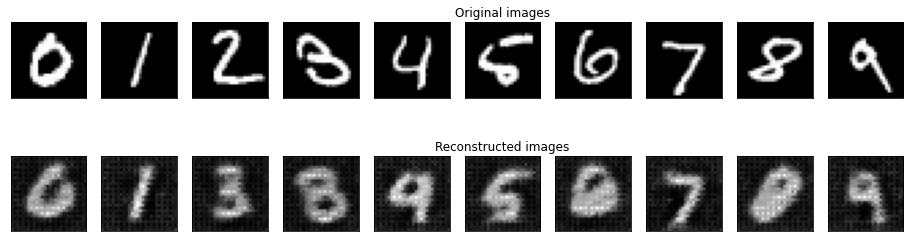

	 partial train loss (single batch): 0.044088
	 partial train loss (single batch): 0.045782
	 partial train loss (single batch): 0.044219

 EPOCH 95/100 	 train loss 0.04469631612300873 	 val loss 0.04693451523780823


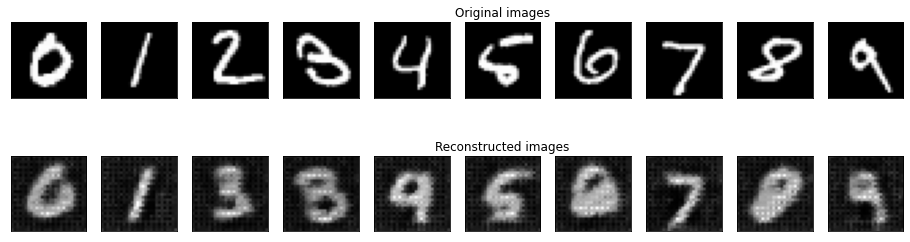

	 partial train loss (single batch): 0.044488
	 partial train loss (single batch): 0.043427
	 partial train loss (single batch): 0.044157

 EPOCH 96/100 	 train loss 0.04402400180697441 	 val loss 0.04704231023788452


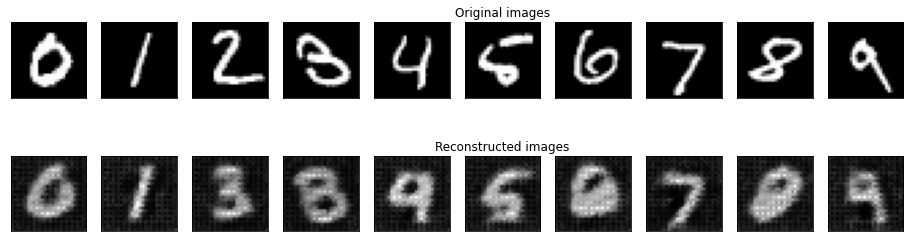

	 partial train loss (single batch): 0.044309
	 partial train loss (single batch): 0.043455
	 partial train loss (single batch): 0.043418

 EPOCH 97/100 	 train loss 0.04372723028063774 	 val loss 0.04643717408180237


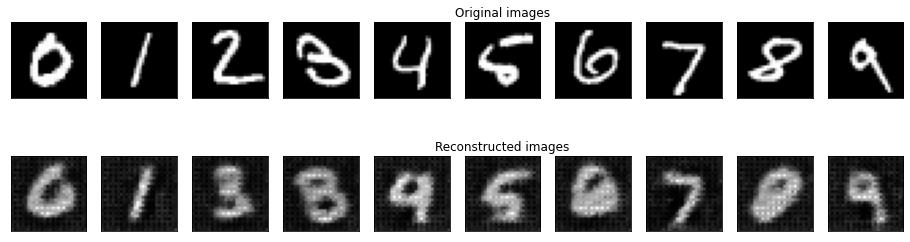

	 partial train loss (single batch): 0.043400
	 partial train loss (single batch): 0.042892
	 partial train loss (single batch): 0.044032

 EPOCH 98/100 	 train loss 0.04344134405255318 	 val loss 0.04629330709576607


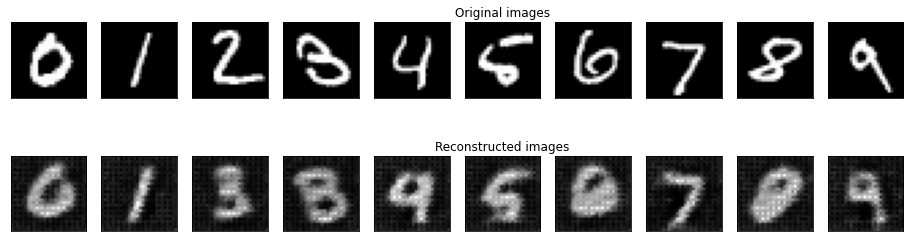

	 partial train loss (single batch): 0.044245
	 partial train loss (single batch): 0.043903
	 partial train loss (single batch): 0.042544

 EPOCH 99/100 	 train loss 0.0435640811920166 	 val loss 0.04615117609500885


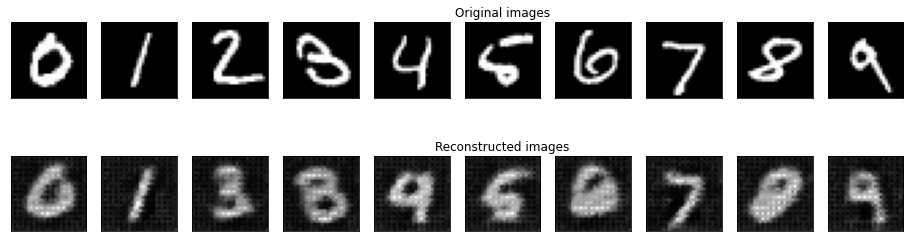

	 partial train loss (single batch): 0.042735
	 partial train loss (single batch): 0.043126
	 partial train loss (single batch): 0.043975

 EPOCH 100/100 	 train loss 0.043278563767671585 	 val loss 0.04652772098779678


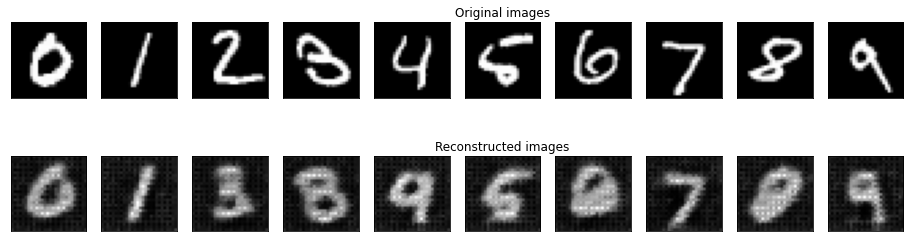

In [518]:
num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(encoder,decoder,device,
   mnist_train_loader,loss_fn,optim)
   val_loss = test_epoch(encoder,decoder,device,mnist_test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(encoder,decoder,n=10)

In [498]:
kernel_size = 4 # (4, 4) kernel
init_channels = 8 # initial number of filters
image_channels = 1 # MNIST images are grayscale
latent_dim = 16 # latent dimension for sampling

In [525]:
for batch_idx, (data, _) in enumerate(mnist_train_loader):
    x = F.relu(nn.Conv2d(
            in_channels=image_channels, out_channels=init_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )(data))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels*4, out_channels=64, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    break

torch.Size([256, 8, 14, 14])
torch.Size([256, 16, 7, 7])
torch.Size([256, 32, 3, 3])
torch.Size([256, 64, 1, 1])


In [ ]:
self.dec1 = nn.ConvTranspose2d(
            in_channels=64, out_channels=init_channels*8, kernel_size=kernel_size, 
            stride=1, padding=1
        )
        self.dec2 = nn.ConvTranspose2d(
            in_channels=init_channels*8, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.dec3 = nn.ConvTranspose2d(
            in_channels=init_channels*4, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.dec4 = nn.ConvTranspose2d(
            in_channels=init_channels*2, out_channels=image_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )

In [575]:
for batch_idx, (data, _) in enumerate(mnist_train_loader):
    x = F.relu(nn.Conv2d(
            in_channels=image_channels, out_channels=init_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )(data))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    x = F.relu(nn.Conv2d(
            in_channels=init_channels*4, out_channels=64, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x))
    print(x.shape)
    
    batch, _, _, _ = x.shape
    x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
    print(x.shape)
    
    hidden = nn.Linear(64, 128)(x)
    print(hidden.shape)
    
    mu = nn.Linear(128, 10)(hidden)
    print(mu.shape)
    
    log_var = nn.Linear(128, 10)(hidden)
    print(log_var.shape)

    def reparameterize(mu, log_var):
        """
        :param mu: mean from the encoder's latent space
        :param log_var: log variance from the encoder's latent space
        """
        std = torch.exp(0.5*log_var) # standard deviation
        eps = torch.randn_like(std) # `randn_like` as we need the same size
        sample = mu + (eps * std) # sampling
        return sample
    z = reparameterize(mu, log_var)
    print(z.shape)
    z = nn.Linear(10, 64)(z)
    print(z.shape)
    z = z.view(-1, 64, 1, 1)
    print(z.shape)
    
    
    x = F.relu(nn.ConvTranspose2d(
            in_channels=64, out_channels=init_channels*8, kernel_size=kernel_size, 
            stride=1, padding=1
        )(z))
    print(x.shape)
    
    x = F.relu(nn.ConvTranspose2d(
            in_channels=init_channels*8, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=3, padding=1
        )(x))
    print(x.shape)
    
    
    x = F.relu(nn.ConvTranspose2d(
            in_channels=init_channels*4, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=3, padding=1
        )(x))
    print(x.shape)
    
    
    t = nn.ConvTranspose2d(
            in_channels=init_channels*2, out_channels=image_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )(x)
    print(t.shape)
    
    reconstruction = torch.sigmoid(t)
    print(reconstruction.shape)
    
    break

torch.Size([256, 8, 14, 14])
torch.Size([256, 16, 7, 7])
torch.Size([256, 32, 3, 3])
torch.Size([256, 64, 1, 1])
torch.Size([256, 64])
torch.Size([256, 128])
torch.Size([256, 10])
torch.Size([256, 10])
torch.Size([256, 10])
torch.Size([256, 64])
torch.Size([256, 64, 1, 1])
torch.Size([256, 64, 2, 2])
torch.Size([256, 32, 5, 5])
torch.Size([256, 16, 14, 14])
torch.Size([256, 1, 28, 28])
torch.Size([256, 1, 28, 28])


In [605]:
latent_dim=16

In [619]:
# define a Conv VAE
class ConvVAE(nn.Module):
    def __init__(self):
        super(ConvVAE, self).__init__()
 
        # encoder
        self.enc1 = nn.Conv2d(
            in_channels=image_channels, out_channels=init_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc2 = nn.Conv2d(
            in_channels=init_channels, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc3 = nn.Conv2d(
            in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc4 = nn.Conv2d(
            in_channels=init_channels*4, out_channels=64, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        # fully connected layers for learning representations
        self.fc1 = nn.Linear(64, 128)
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_log_var = nn.Linear(128, latent_dim)
        self.fc2 = nn.Linear(latent_dim, 64)
        # decoder 
        self.dec1 = nn.ConvTranspose2d(
            in_channels=64, out_channels=init_channels*8, kernel_size=kernel_size, 
            stride=1, padding=1
        )
        self.dec2 = nn.ConvTranspose2d(
            in_channels=init_channels*8, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=3, padding=1
        )
        self.dec3 = nn.ConvTranspose2d(
            in_channels=init_channels*4, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=3, padding=1
        )
        self.dec4 = nn.ConvTranspose2d(
            in_channels=init_channels*2, out_channels=image_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        
        
        
    def reparameterize(self, mu, log_var):
        """
        :param mu: mean from the encoder's latent space
        :param log_var: log variance from the encoder's latent space
        """
        std = torch.exp(0.5*log_var) # standard deviation
        eps = torch.randn_like(std) # `randn_like` as we need the same size
        sample = mu + (eps * std) # sampling
        return sample
 
    def forward(self, x):
        # encoding
        x = F.relu(self.enc1(x))
        x = F.relu(self.enc2(x))
        x = F.relu(self.enc3(x))
        x = F.relu(self.enc4(x))
        batch, _, _, _ = x.shape
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        hidden = self.fc1(x)
        # get `mu` and `log_var`
        mu = self.fc_mu(hidden)
        log_var = self.fc_log_var(hidden)
        # get the latent vector through reparameterization
        z = self.reparameterize(mu, log_var)
        z = self.fc2(z)
        z = z.view(-1, 64, 1, 1)
        
        return self.decode(z), mu, log_var
 
        # decoding
    def decode(self, z):
        x = F.relu(self.dec1(z))
        x = F.relu(self.dec2(x))
        x = F.relu(self.dec3(x))
        reconstruction = torch.sigmoid(self.dec4(x))
        return reconstruction
    
    
        

    def loss_function(self,x, y, mu, log_var):
        
        reconstruction_error = F.binary_cross_entropy(y, x, reduction='sum')

        KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        return reconstruction_error + KLD
    

In [621]:
# create model
convvae_dim_1 = ae_dim_1
convvae_dim_2 = ae_dim_2
convvae_model = ConvVAE()
convvae_optimizer = optim.Adam(convvae_model.parameters())

In [622]:
def train_convvae(convvae_model,data_train_loader,epoch):
  train_loss = 0
  for batch_idx, (data, _) in enumerate(data_train_loader):
    convvae_optimizer.zero_grad()
    y, z_mu, z_log_var = convvae_model(data) #FILL IN STUDENT
    loss_convvae = convvae_model.loss_function(data, y, z_mu, z_log_var) #FILL IN STUDENT
    loss_convvae.backward()
    train_loss += loss_convvae.item()
    convvae_optimizer.step() 
		
    if batch_idx % 100 == 0:
      print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
      epoch, batch_idx * len(data), len(data_train_loader.dataset),
      100. * batch_idx / len(data_train_loader), loss_convvae.item() / len(data)))
  print('====> Epoch: {} Average loss: {:.4f}'.format(epoch, train_loss / len(data_train_loader.dataset)))

In [623]:
# now train the model
n_epochs=100
for epoch in range(0, n_epochs):
  train_convvae(convvae_model,mnist_train_loader,epoch)

Train Epoch: 0 [0/1000 (0%)]	Loss: 481.910645
====> Epoch: 0 Average loss: 370.0003
Train Epoch: 1 [0/1000 (0%)]	Loss: 480.224121
====> Epoch: 1 Average loss: 368.6609
Train Epoch: 2 [0/1000 (0%)]	Loss: 478.639008
====> Epoch: 2 Average loss: 366.9910
Train Epoch: 3 [0/1000 (0%)]	Loss: 474.994507
====> Epoch: 3 Average loss: 363.7958
Train Epoch: 4 [0/1000 (0%)]	Loss: 469.272736
====> Epoch: 4 Average loss: 358.3930
Train Epoch: 5 [0/1000 (0%)]	Loss: 460.000366
====> Epoch: 5 Average loss: 348.1434
Train Epoch: 6 [0/1000 (0%)]	Loss: 435.863373
====> Epoch: 6 Average loss: 325.2721
Train Epoch: 7 [0/1000 (0%)]	Loss: 394.809479
====> Epoch: 7 Average loss: 293.4732
Train Epoch: 8 [0/1000 (0%)]	Loss: 382.012543
====> Epoch: 8 Average loss: 278.2783
Train Epoch: 9 [0/1000 (0%)]	Loss: 339.854645
====> Epoch: 9 Average loss: 255.2490
Train Epoch: 10 [0/1000 (0%)]	Loss: 325.800323
====> Epoch: 10 Average loss: 244.3586
Train Epoch: 11 [0/1000 (0%)]	Loss: 304.737396
====> Epoch: 11 Average los

In [626]:
def generate_images_convvae(convvae_model,n_images = 5):

  epsilon = torch.randn(n_images,1,vae_model.z_dim)
  imgs_generated = convvae_model.decode(epsilon)
  return(imgs_generated)

imgs_generated = generate_images_convvae(convvae_model,n_images=5)
display_images(imgs_generated)

RuntimeError: Given transposed=1, weight of size [64, 64, 4, 4], expected input[1, 5, 1, 10] to have 64 channels, but got 5 channels instead